# Business Intelligence per i Servizi Finaziari
## Progetto di Laboratorio in Python

Importazione delle librerie da utilizzare

In [1]:
import pandas_datareader.data as web
import datetime as dt
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pylab as pl 
import statsmodels.api as sm
import seaborn as sns
import functools as ft
import scipy.optimize as sco
import statsmodels.formula.api as smf
import itertools
import warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from matplotlib import style
from sklearn.metrics import mean_squared_error
from math import sqrt
from scipy.stats import norm
from copy import deepcopy

In [2]:
pd.options.mode.chained_assignment = None
warnings.filterwarnings("ignore")

In [3]:
# Possibilità di attivare o meno la modalità scura
dark_mode = True
if(dark_mode):
    plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle')
else:
    plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-light.mplstyle')

Intervallo temporale di analisi dei titoli:

In [4]:
start_date = '2011-11-30'
end_date = '2021-11-30'

In [5]:
tickers = ['GM', 'TSLA', 'JNJ', 'PFE', 'NVDA', 'INTC']

In [6]:
colors = ['#7A76C2', '#ff6e9c98', '#f62196', '#18c0c4', '#f3907e', '#66E9EC']

Importazione dei dati da Yahoo Finance

In [7]:
yahoo_data = web.get_data_yahoo(tickers, start_date, end_date)

In [8]:
adj_close = yahoo_data['Adj Close']
adj_close.head()

Symbols,GM,TSLA,JNJ,PFE,NVDA,INTC
Date,,,,,,
2011-11-30,16.454910,6.548,48.166531,13.022167,3.588100,18.277067
2011-12-01,16.199854,6.520,47.965591,12.996212,3.631718,18.284407
2011-12-02,16.447180,6.660,47.236252,12.905373,3.608761,18.078962
2011-12-05,16.686779,6.884,47.154381,12.872930,3.553665,18.350439
2011-12-06,16.756334,6.974,47.251125,13.125976,3.503162,18.599905


Aggreghiamo i dati mensilmente

In [9]:
month_data = yahoo_data.groupby(pd.Grouper(freq='M')).mean()
month_data = month_data['Adj Close']

In [10]:
month_data.head()

Symbols,GM,TSLA,JNJ,PFE,NVDA,INTC
Date,,,,,,
2011-11-30,16.454910,6.548000,48.166531,13.022167,3.588100,18.277067
2011-12-31,15.859043,5.996000,47.948932,13.587889,3.291634,17.795956
2012-01-31,18.445110,5.498000,48.609348,14.119673,3.307916,18.990249
2012-02-29,20.096783,6.552400,48.469774,13.881185,3.632291,19.807980
2012-03-31,19.739707,7.048182,48.804943,14.316905,3.395996,20.327891


Mostriamo i grafici dei prezzi di chiusura

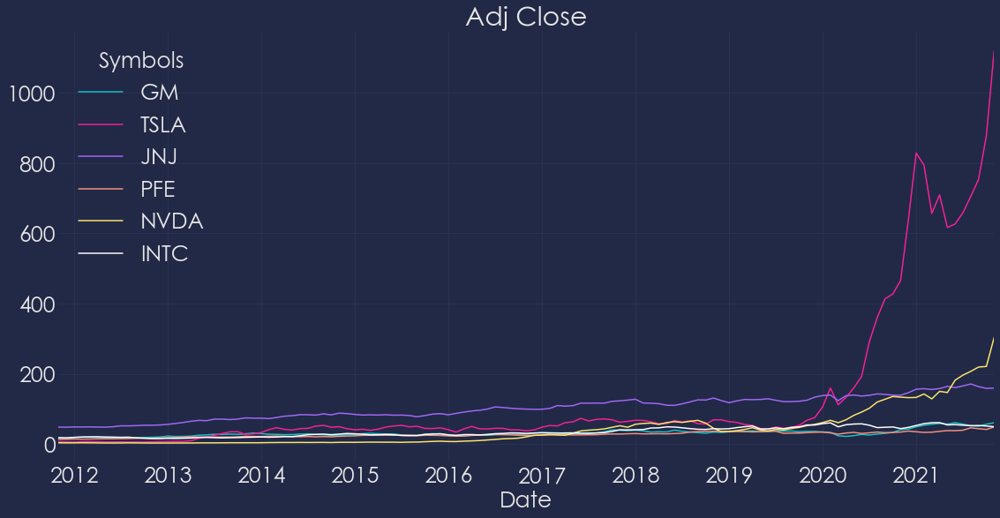

In [11]:
plt.rc('font', size=25, family='Century Gothic')
month_data.plot(grid = True, figsize=(19,9), title="Adj Close");
plt.show()

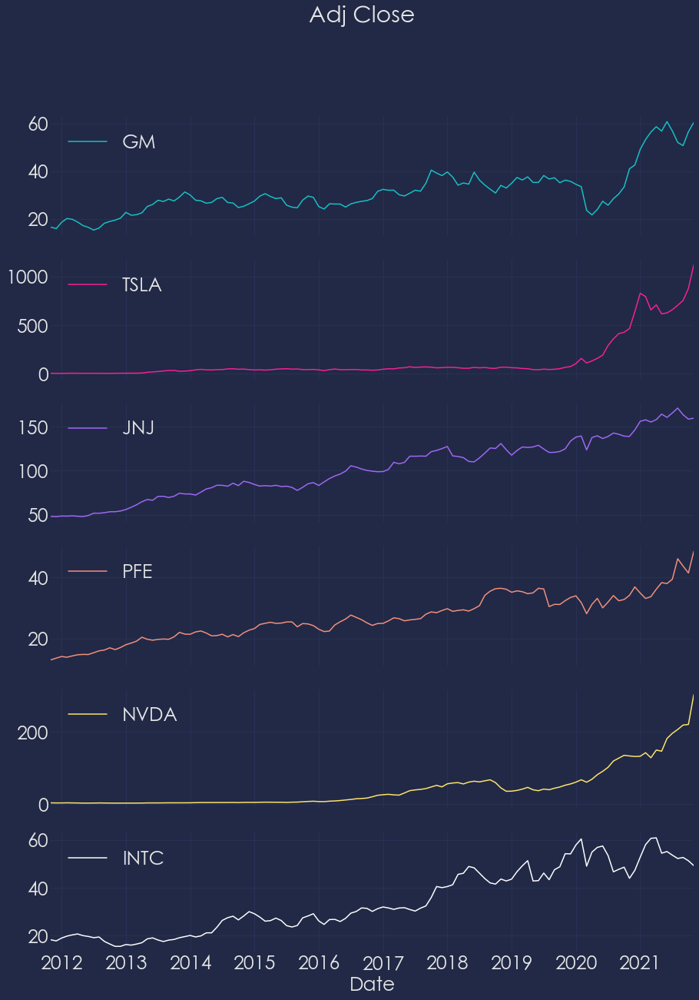

In [12]:
month_data.plot(subplots = True, grid = True, figsize=(15,20), title="Adj Close");
plt.show()

## Statistiche Descrittive

### Calcolo dei rendimenti

In [13]:
# Rendimenti logaritmici
# GM_rtn = np.log(GM_TSLA["Adj Close_GM"] / GM_TSLA["Adj Close_GM"].shift(1))

Rendimenti semplici

In [14]:
month_rtns = month_data.pct_change().dropna()

In [15]:
month_rtns.head()

Symbols,GM,TSLA,JNJ,PFE,NVDA,INTC
Date,,,,,,
2011-12-31,-0.036212,-0.084301,-0.004518,0.043443,-0.082625,-0.026323
2012-01-31,0.163066,-0.083055,0.013773,0.039137,0.004947,0.067110
2012-02-29,0.089545,0.191779,-0.002871,-0.016890,0.098060,0.043061
2012-03-31,-0.017768,0.075664,0.006915,0.031389,-0.065054,0.026248
2012-04-30,-0.058594,-0.049542,-0.009117,0.026140,-0.058350,0.018466


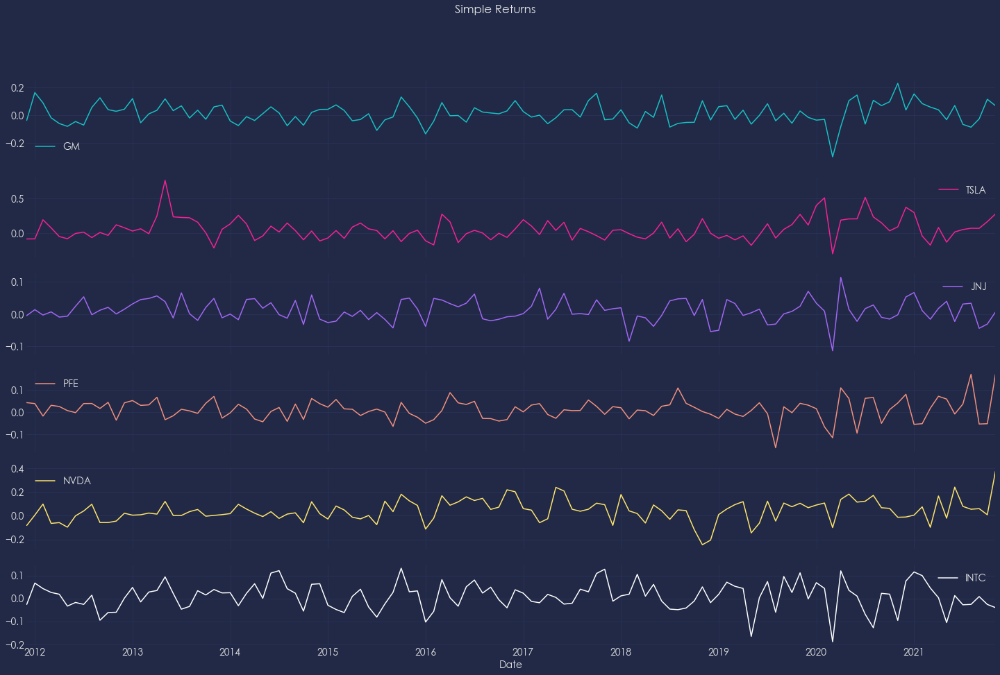

In [16]:
plt.rc('font', size=14)
month_rtns.plot(subplots = True, grid = True, figsize=(25, 15), title="Simple Returns");
plt.show()

Rendimenti composti

In [17]:
month_cum_rtns = (1 + month_rtns).cumprod()

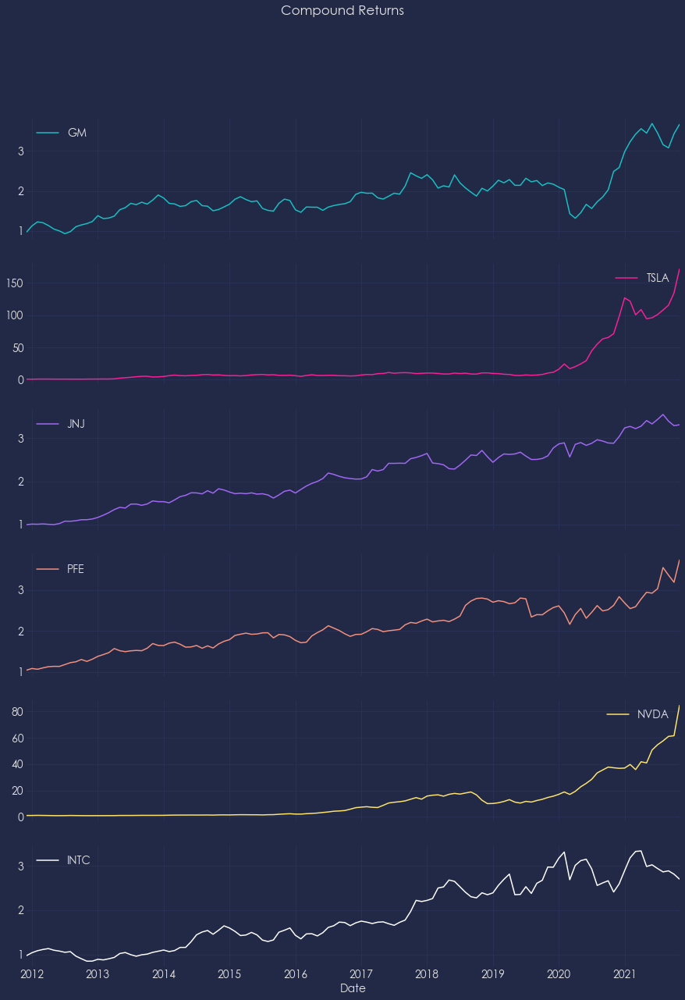

In [18]:
plt.rc('font', size=14)
month_cum_rtns.plot(subplots = True, grid = True, figsize=(15,20), title="Compound Returns");
plt.show()

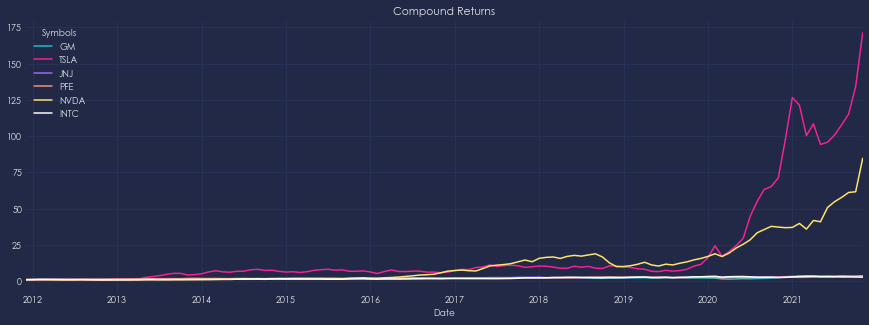

In [19]:
plt.rc('font', size=9)
month_cum_rtns.plot(grid = True, figsize=(15,5), title="Compound Returns");
plt.show()

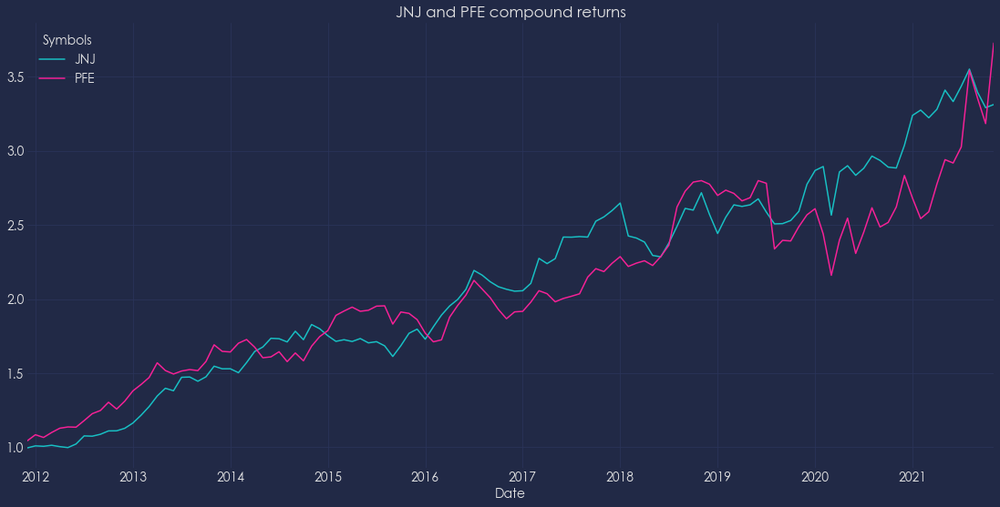

In [20]:
df = month_cum_rtns[["JNJ", "PFE"]]
plt.rc('font', size=14)
df.plot(grid = True, figsize=(19,9), title="JNJ and PFE compound returns");
plt.show()

### Grafico dei rendimenti e della loro distribuzione

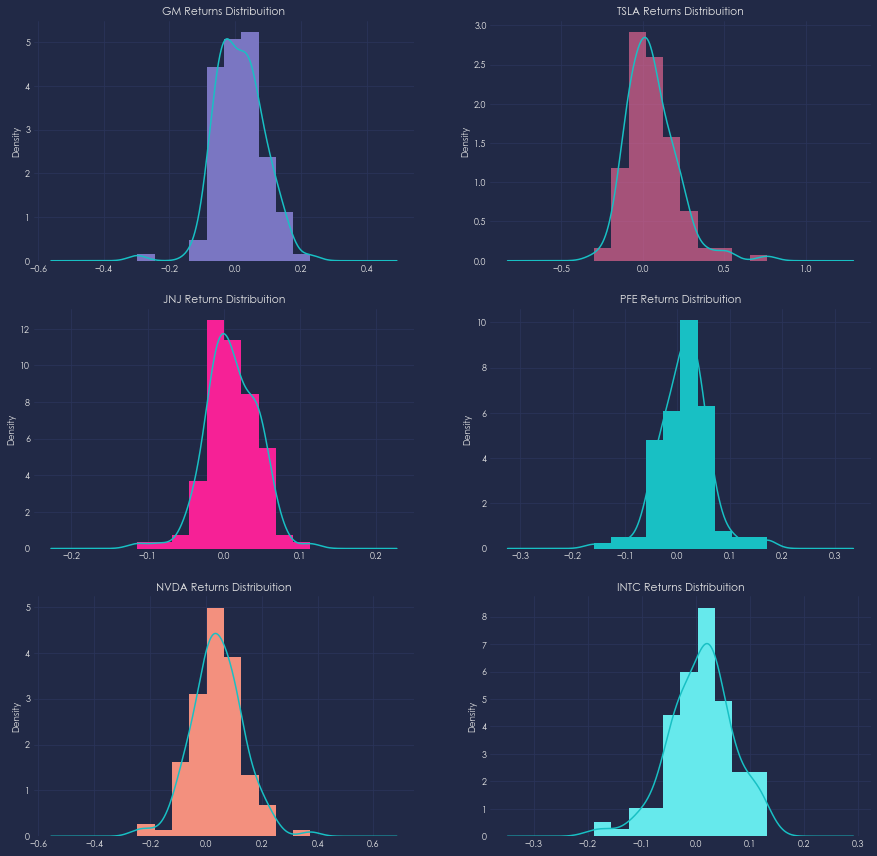

In [21]:
plt.figure(figsize=(15, 15))
plt.rc('font', size=9)

# Creo un grafico a griglia
for i in range(6):
    plt.subplot(321 + i)
    plt.hist(month_rtns.iloc[:, i], color = colors[i], density = True)
    plt.title(month_rtns.columns[i] + ' Returns Distribuition')
    month_rtns.iloc[:, i].plot.density()
    plt.grid(True)
plt.show()

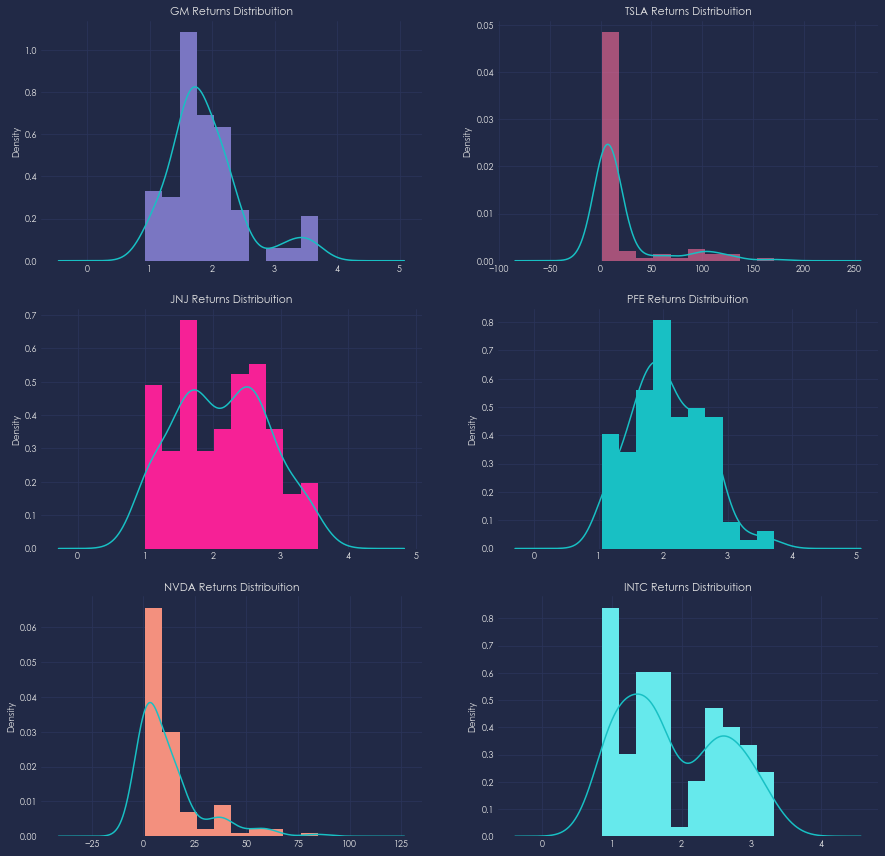

In [22]:
plt.figure(figsize=(15, 15))
plt.rc('font', size=9)

# Creo un grafico a griglia
for i in range(6):
    plt.subplot(321 + i)
    plt.hist(month_cum_rtns.iloc[:, i], color = colors[i], density = True)
    plt.title(month_cum_rtns.columns[i] + ' Returns Distribuition')
    month_cum_rtns.iloc[:, i].plot.density()
    plt.grid(True)
plt.show()

### Grafici Diagnostici

In [23]:
def plot_diagnosis(column, color):
    
    plt.figure()
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,10))
    fig.suptitle(column, size='xx-large')
    
    # Histogram
    month_rtns[column].hist(density = True, color=color, ax=axes[0, 0])
    axes[0, 0].set_title('Histogram')
    
    # Q-Q Plot
    sm.qqplot(month_rtns[column], line = 's', color=color, ax=axes[0, 1])
    axes[0, 1].get_lines()[0].set_markerfacecolor(color)
    axes[0, 1].get_lines()[1].set_color(colors[0])
    axes[0, 1].set_title('Q-Q Plot')
    
    # Kernel density Plot
    month_rtns[column].plot.density(color=color, ax=axes[1,0])
    axes[1, 0].set_title('Kernel density')
    
    # Boxplot
    month_rtns[column].to_frame().boxplot(color=color, sym = 'x', ax=axes[1, 1])
    axes[1, 1].set_title('Boxplot')

    plt.show()

<Figure size 432x288 with 0 Axes>

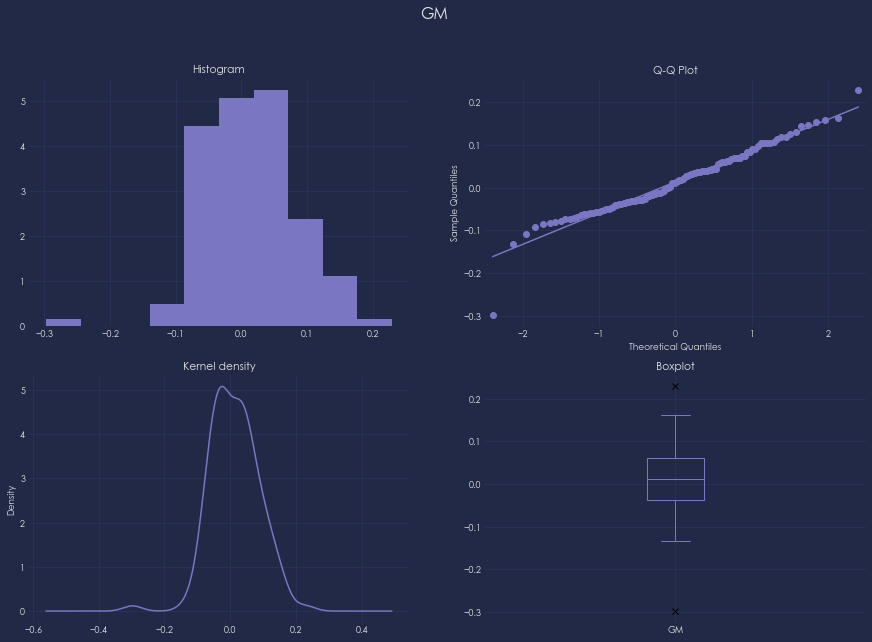

In [24]:
plot_diagnosis('GM', colors[0]);

<Figure size 432x288 with 0 Axes>

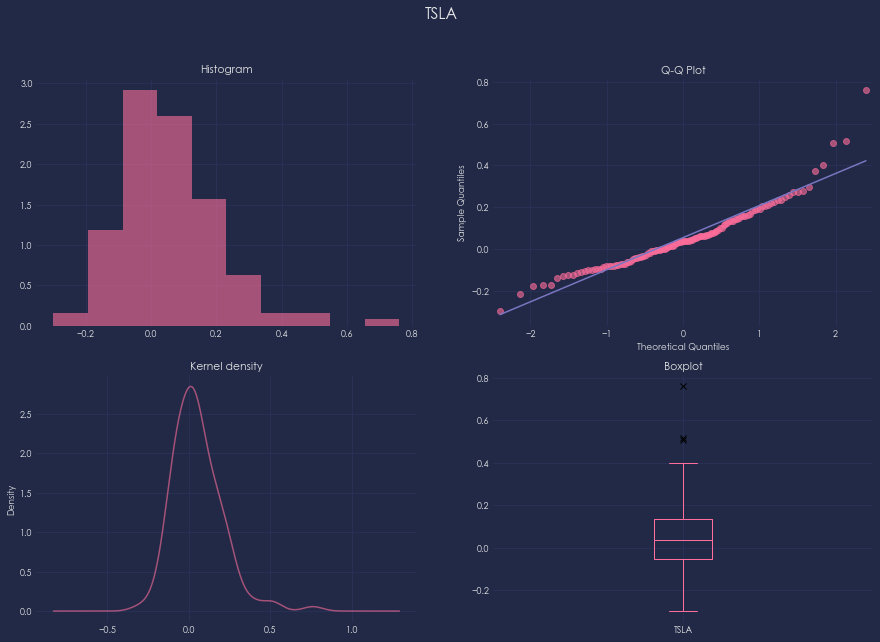

In [25]:
plot_diagnosis('TSLA', colors[1]);

<Figure size 432x288 with 0 Axes>

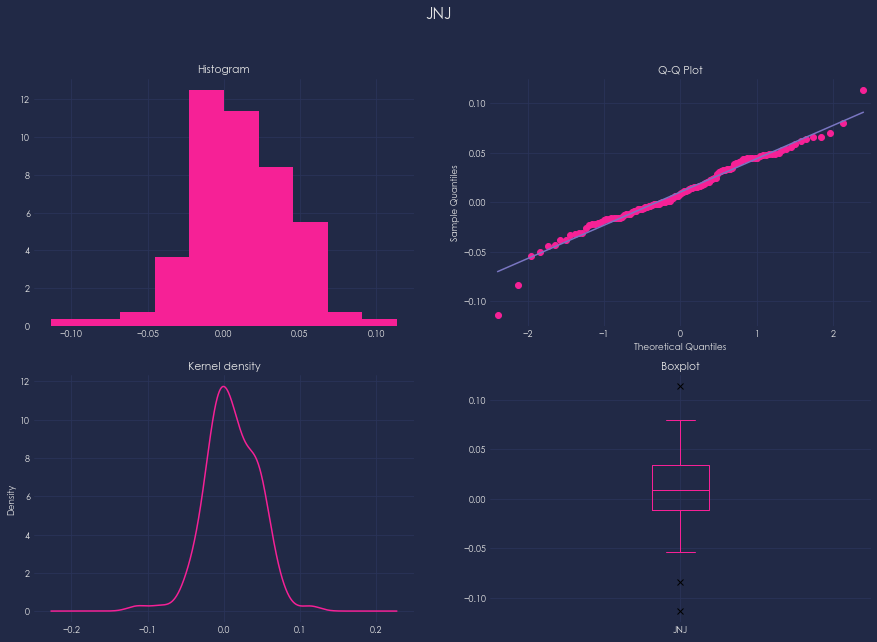

In [26]:
plot_diagnosis('JNJ', colors[2]);

<Figure size 432x288 with 0 Axes>

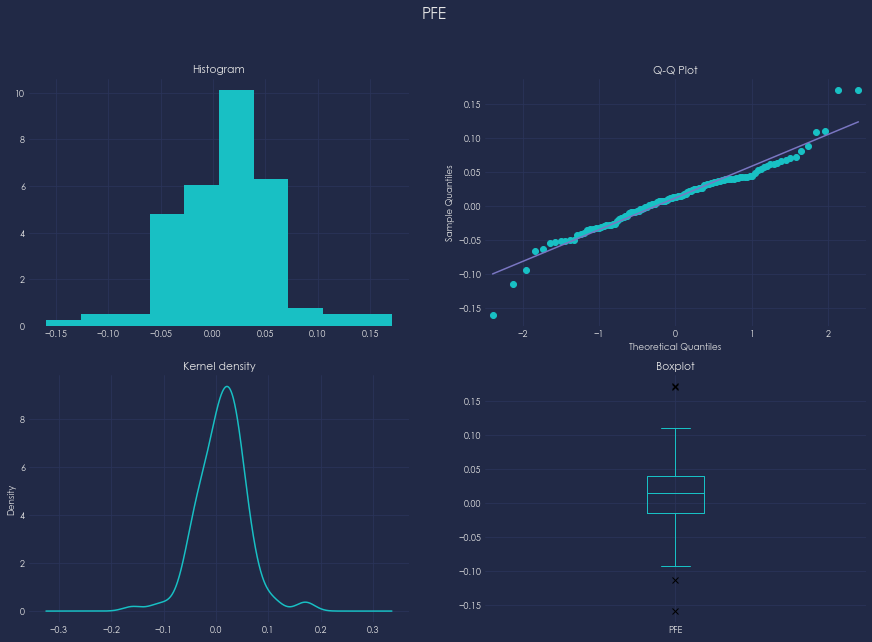

In [27]:
plot_diagnosis('PFE', colors[3]);

<Figure size 432x288 with 0 Axes>

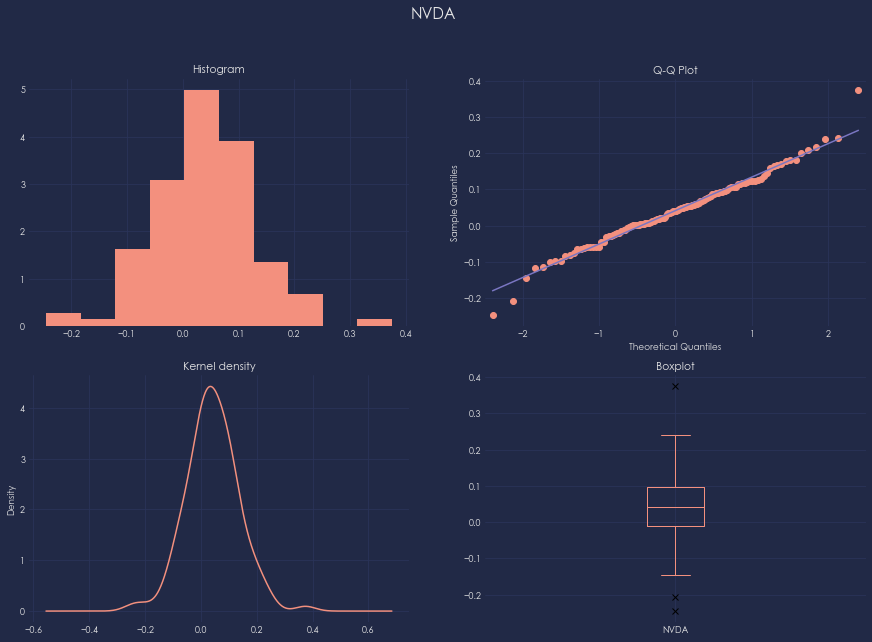

In [28]:
plot_diagnosis('NVDA', colors[4]);

<Figure size 432x288 with 0 Axes>

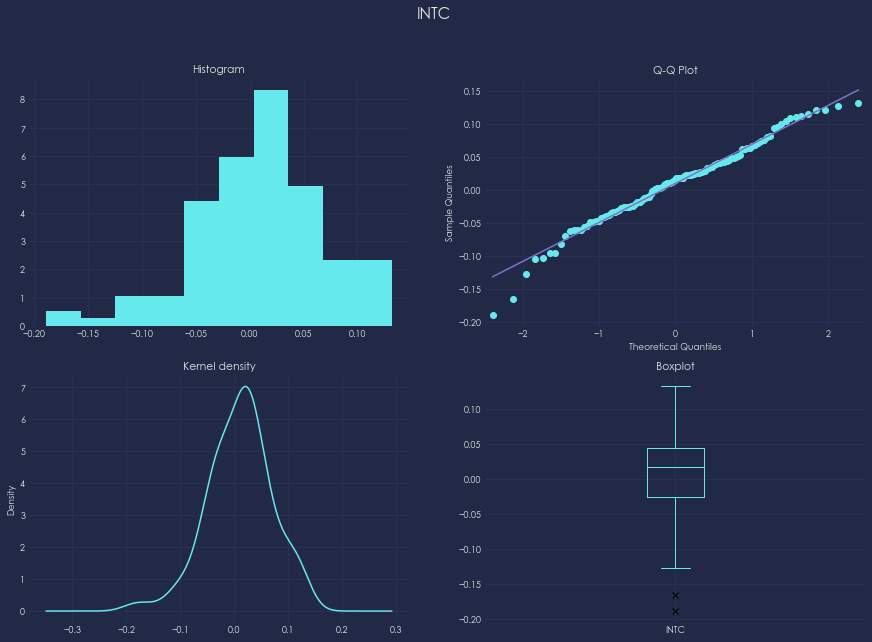

In [29]:
plot_diagnosis('INTC', colors[5]);

### Statistiche descrittive univariate

Media

In [30]:
for column in month_rtns:
    print(column + ': ', round(month_rtns[column].mean(), 4))

GM:  0.0136
TSLA:  0.0541
JNJ:  0.0106
PFE:  0.0121
NVDA:  0.0418
INTC:  0.0101


Varianza

In [31]:
for column in month_rtns:
    print(column + ': ', round(month_rtns[column].var(), 4))

GM:  0.0054
TSLA:  0.0237
JNJ:  0.0011
PFE:  0.0022
NVDA:  0.0086
INTC:  0.0035


Deviazione Standard

In [32]:
for column in month_rtns:
    print(column + ': ', round(month_rtns[column].std(), 4))

GM:  0.0735
TSLA:  0.1541
JNJ:  0.0338
PFE:  0.0468
NVDA:  0.0927
INTC:  0.0593


Asimmetria

In [33]:
for column in month_rtns:
    print(column + ': ', round(month_rtns[column].skew(), 4))

GM:  -0.2196
TSLA:  1.2628
JNJ:  -0.2365
PFE:  0.0313
NVDA:  0.1212
INTC:  -0.4173


Curtosi

In [34]:
for column in month_rtns:
    print(column + ': ', round(month_rtns[column].kurtosis(), 4))

GM:  1.9447
TSLA:  3.5872
JNJ:  1.2175
PFE:  2.5821
NVDA:  1.3015
INTC:  0.7682


Osserviamo la variazione della volatilità nel tempo visualizzando l'evolversi della deviazione standard:

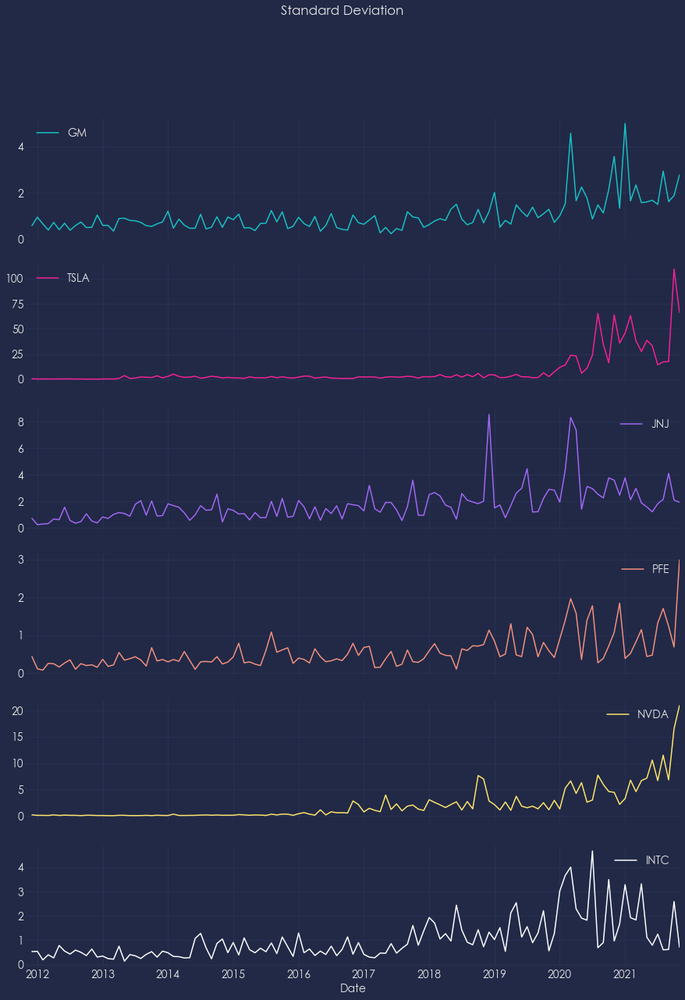

In [35]:
month_std = yahoo_data.groupby(pd.Grouper(freq='M')).std()
month_std = month_std['Adj Close']
plt.rc('font', size=14)
month_std.plot(subplots = True, grid = True, figsize=(15,20), title="Standard Deviation");

### Matrice di Varianze/Covarianze

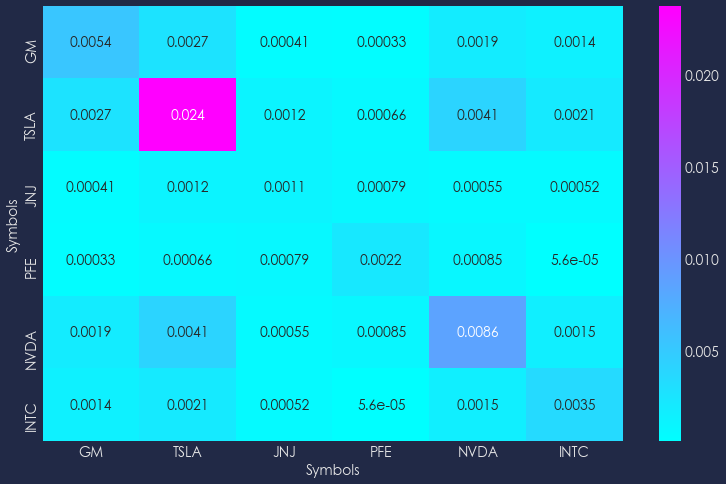

In [36]:
covMatrix = month_rtns.cov()
plt.figure(figsize=(13, 8))
sns.heatmap(covMatrix, cmap='cool', annot=True)
plt.show()

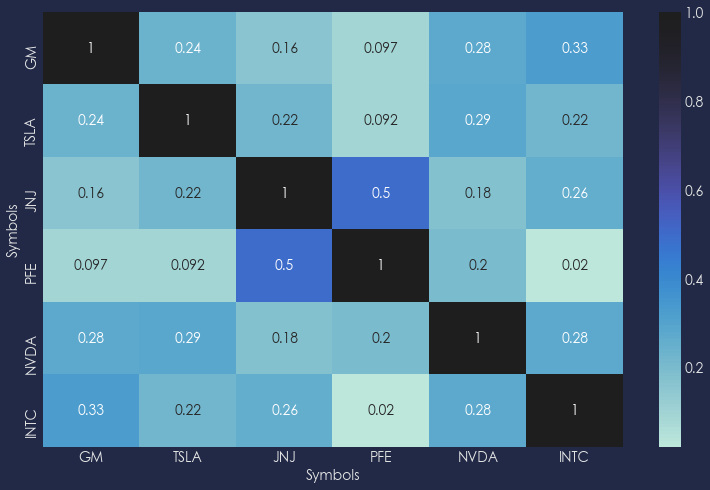

In [37]:
corr_df = month_rtns.corr(method='pearson')
corr_df.head().reset_index()
corr_df.head(10)
plt.figure(figsize=(13, 8))
sns.heatmap(corr_df, center=1, annot=True)
plt.show()

### Grafico andamento nel tempo delle correlazioni fra i titoli e grafici di dispersione

In [38]:
df = yahoo_data['Adj Close']
rets = np.log(df / df.shift(1))
rets.dropna(inplace = True)

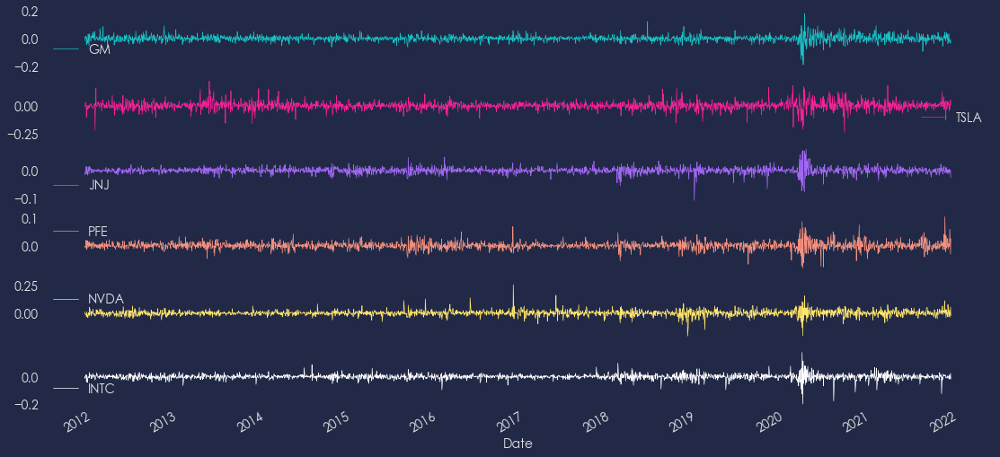

In [39]:
rets.plot(subplots=True, linewidth=0.7, grid = False, figsize=(19,9));

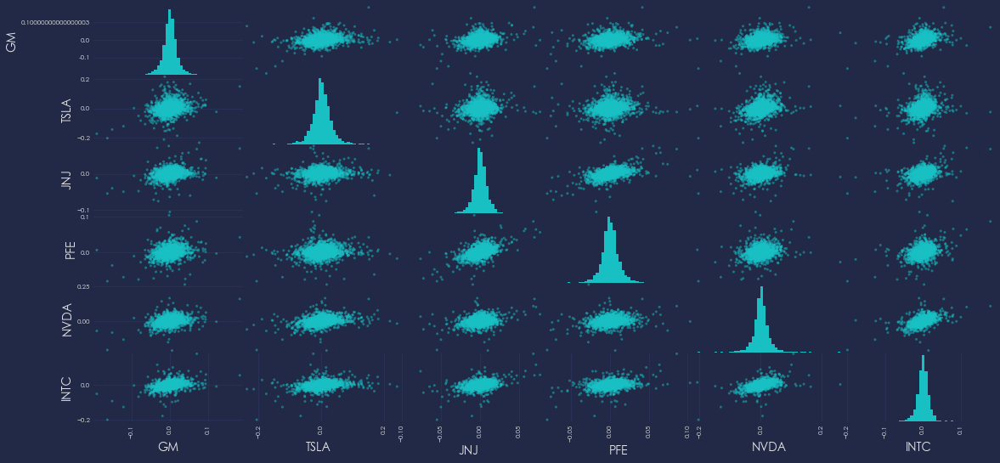

In [40]:
pd.plotting.scatter_matrix(rets, alpha=0.5,
           diagonal = 'hist',
                  hist_kwds={'bins': 50},
                  figsize = (19,9), grid = True);

Per ogni coppia di titoli visualizzo lo scatter plot e la retta di regressione:

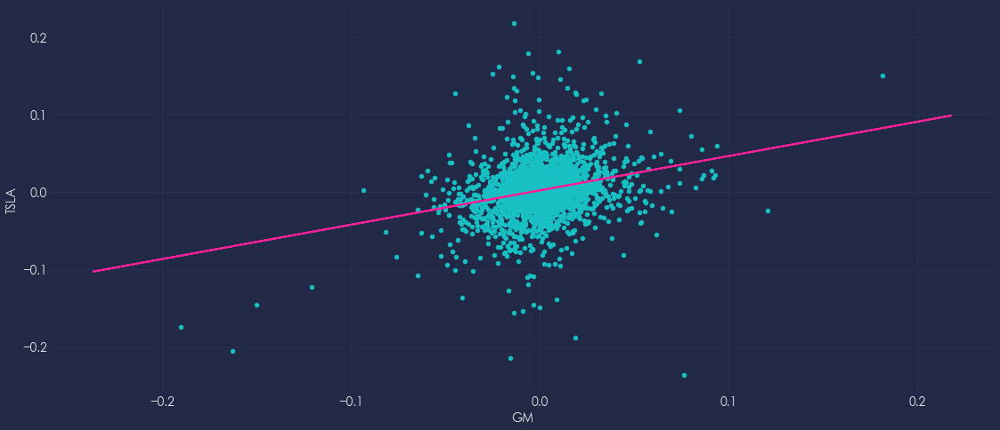

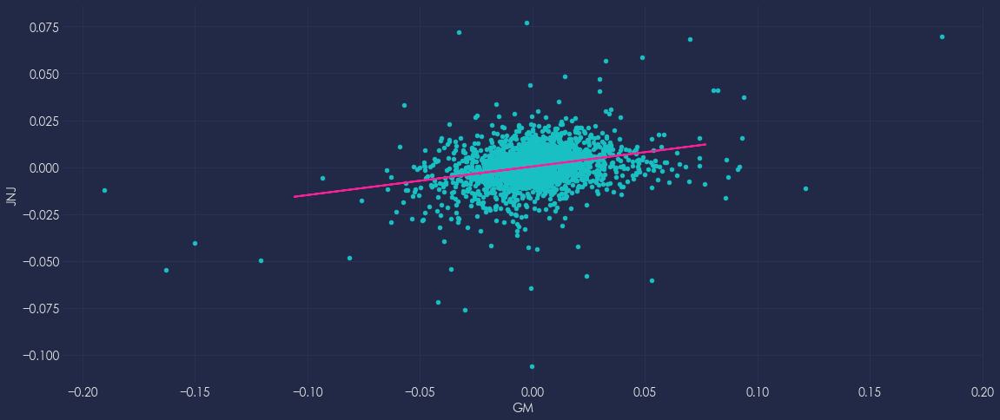

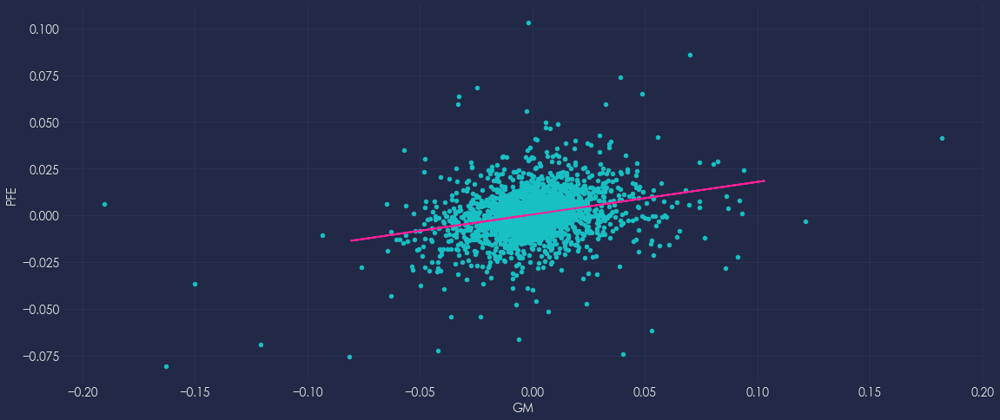

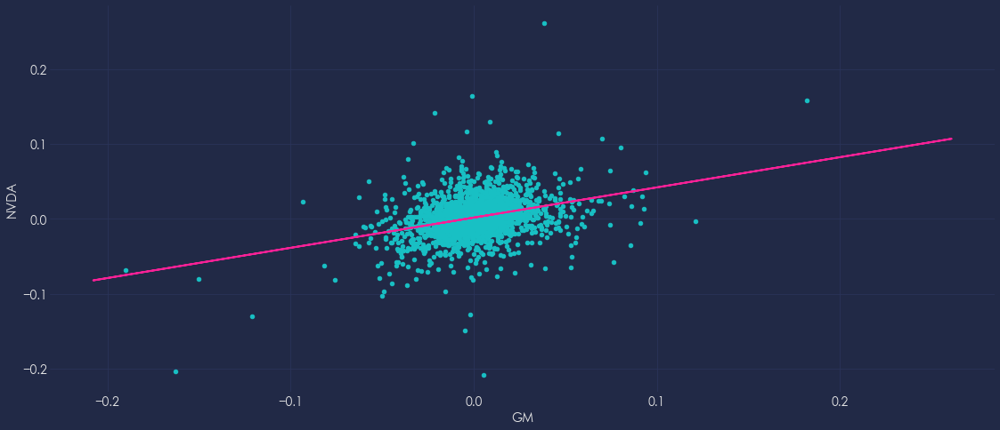

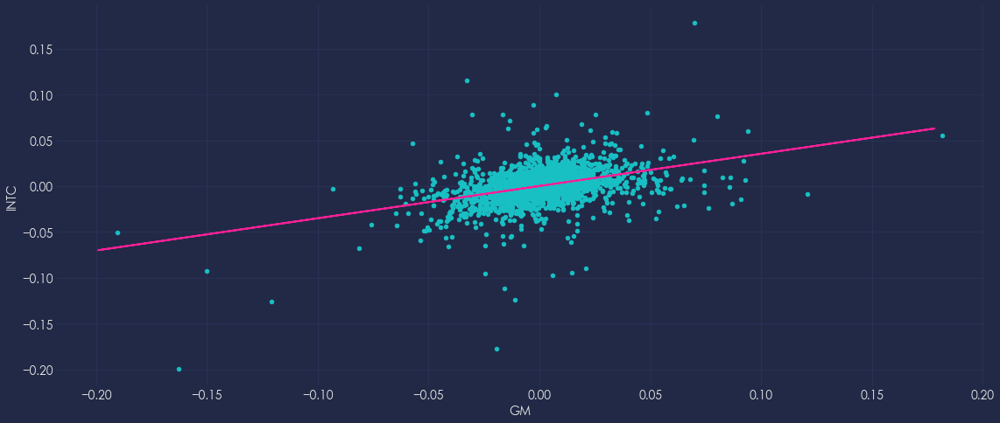

...

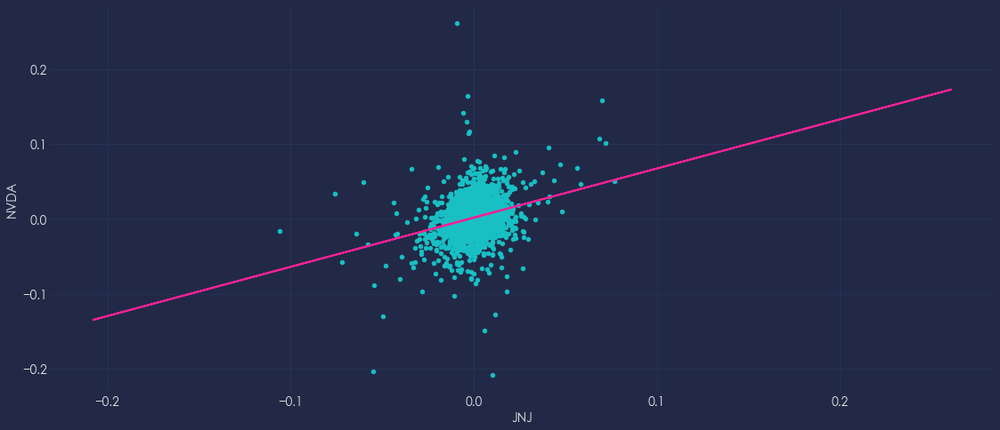

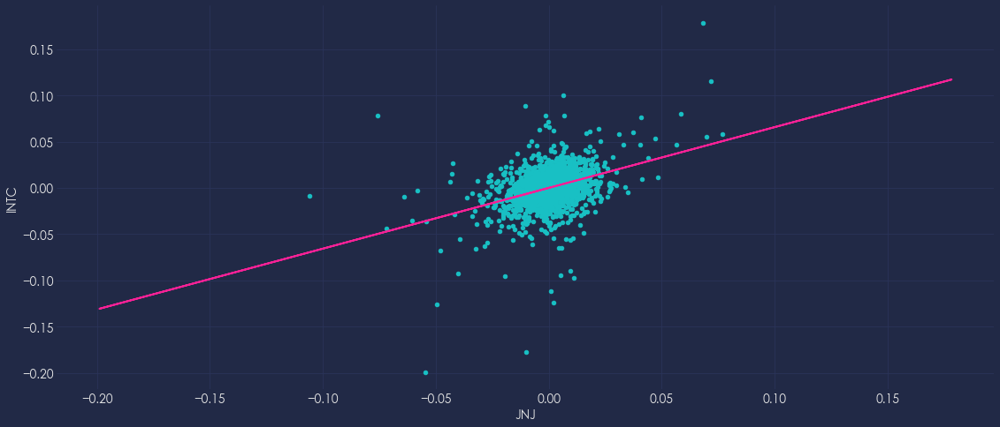

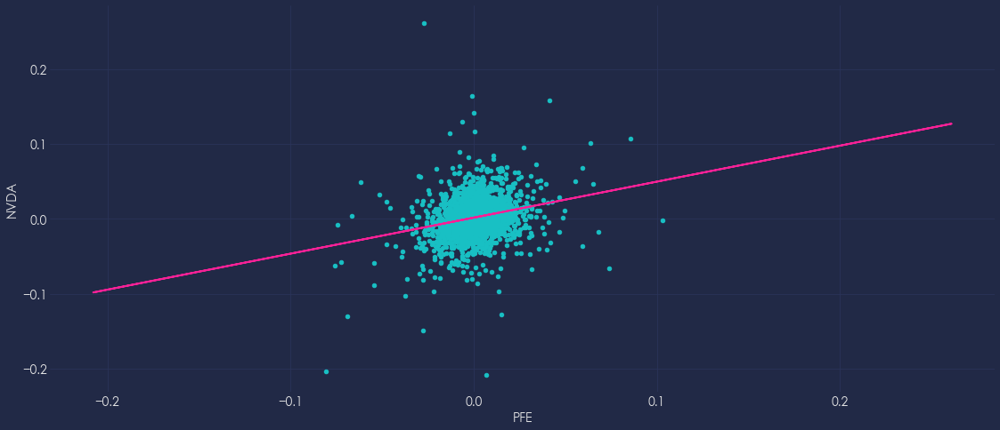

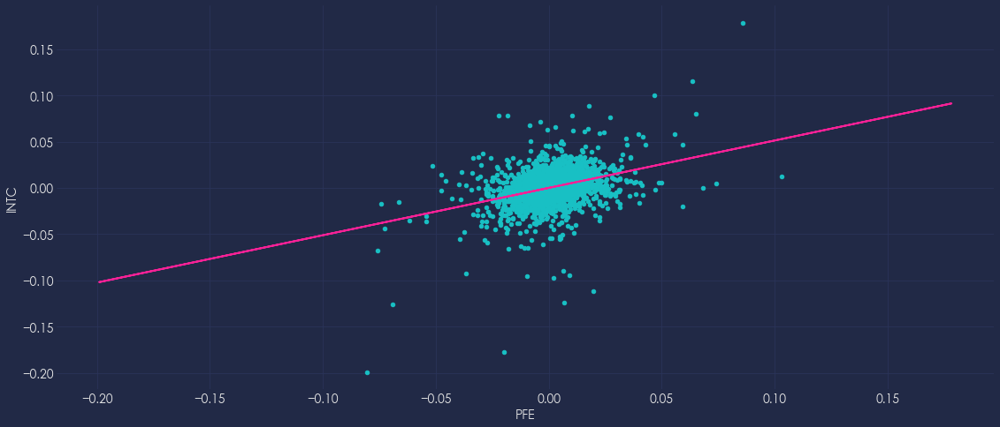

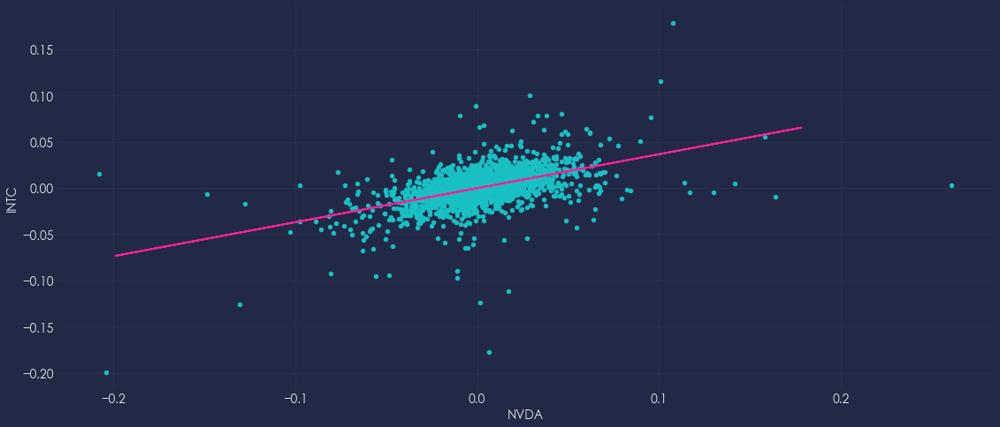

In [41]:
plt.rc('font', size=14)
tickers1 = deepcopy(tickers)
tickers2 = deepcopy(tickers)
for t1 in tickers1:
    for t2 in tickers2:
        if (t1 == t2):
            continue
        reg = np.polyfit(rets[t1], rets[t2], deg=1)
        ax = rets.plot(kind = 'scatter', x = t1, y= t2, figsize=(19,8))
        ax.plot(rets[t2], np.polyval(reg, rets[t2]), colors[2], lw=2);
    tickers2.remove(t1)

Osserviamo la variazione della correlazione nel tempo:

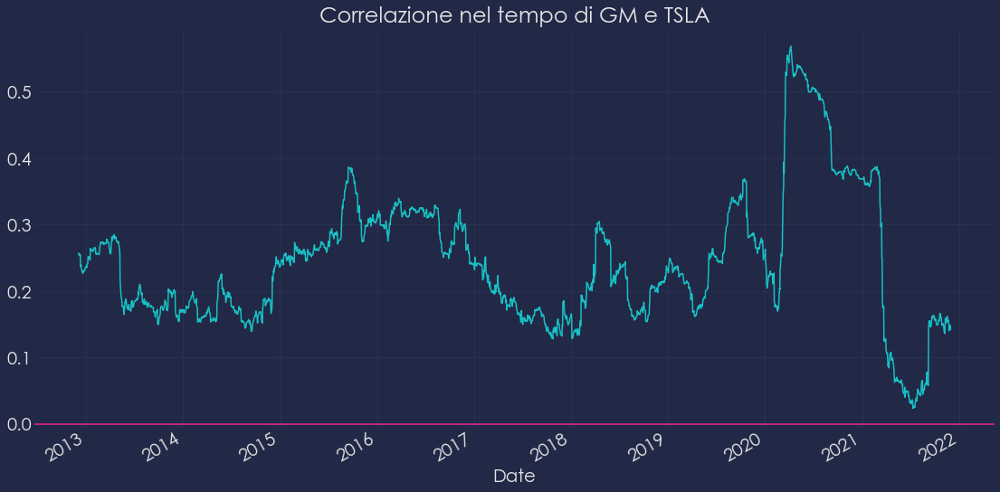

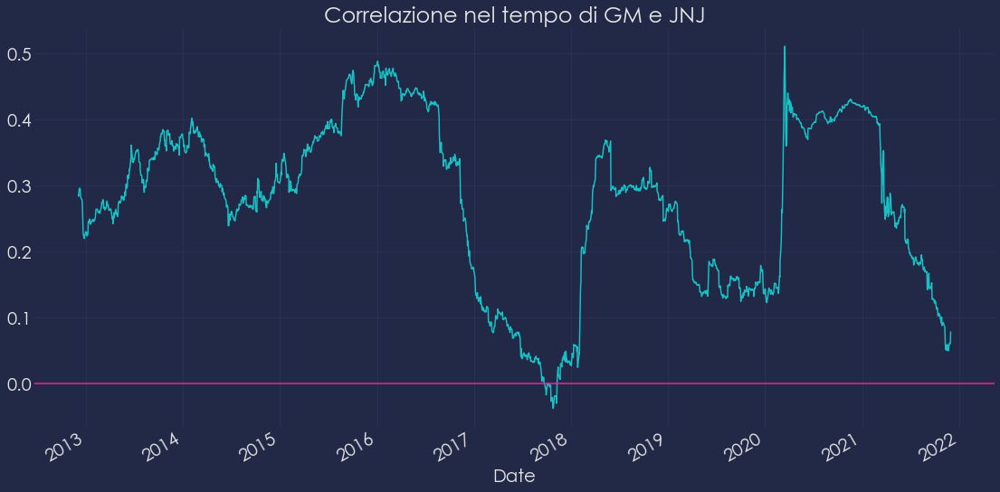

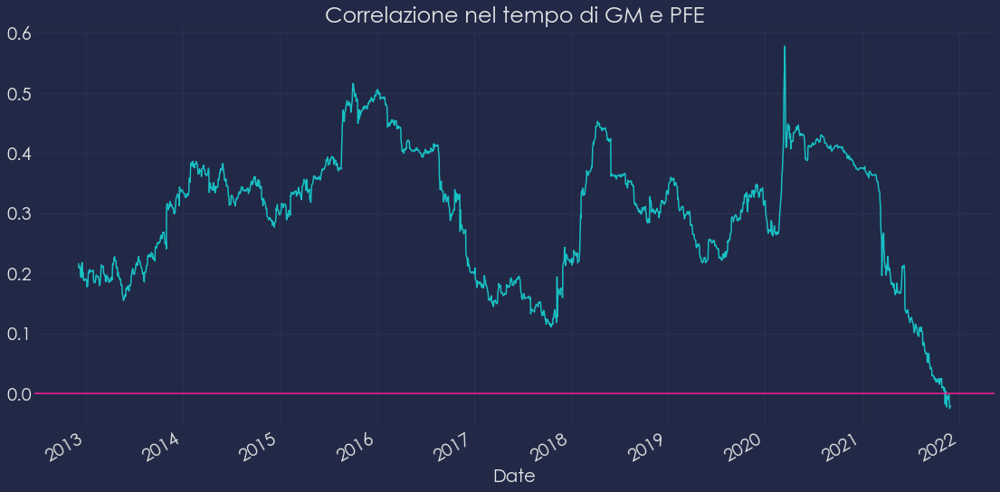

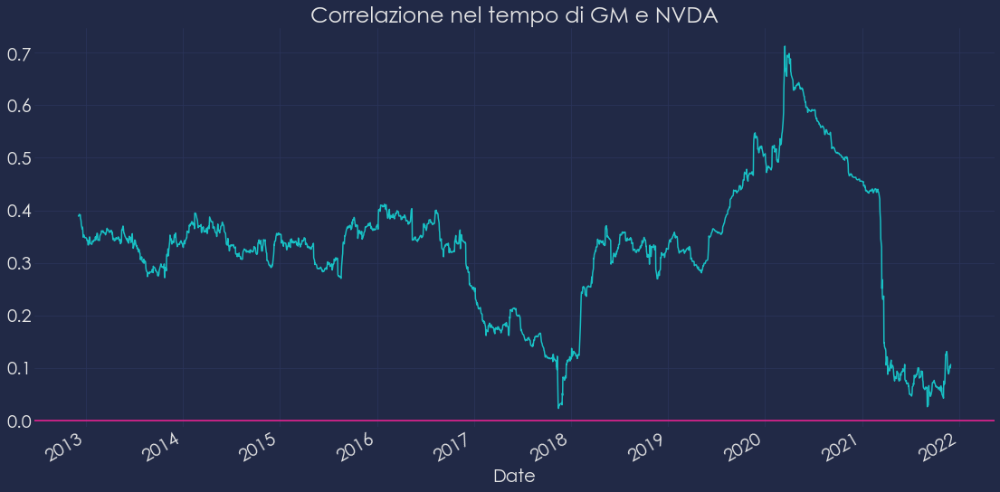

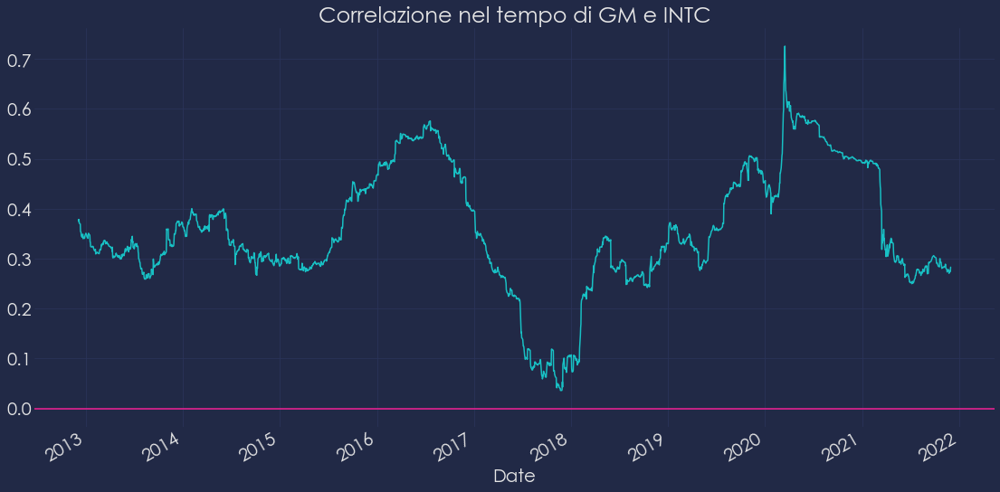

...

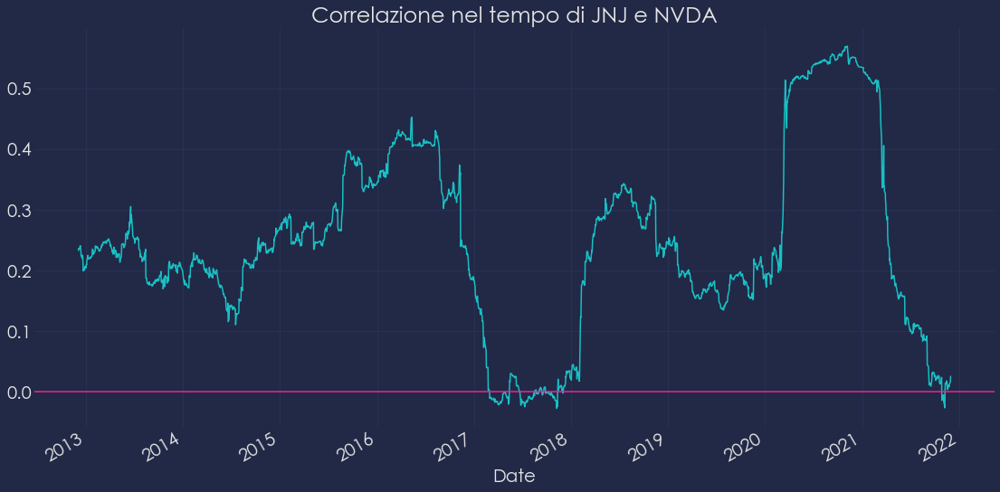

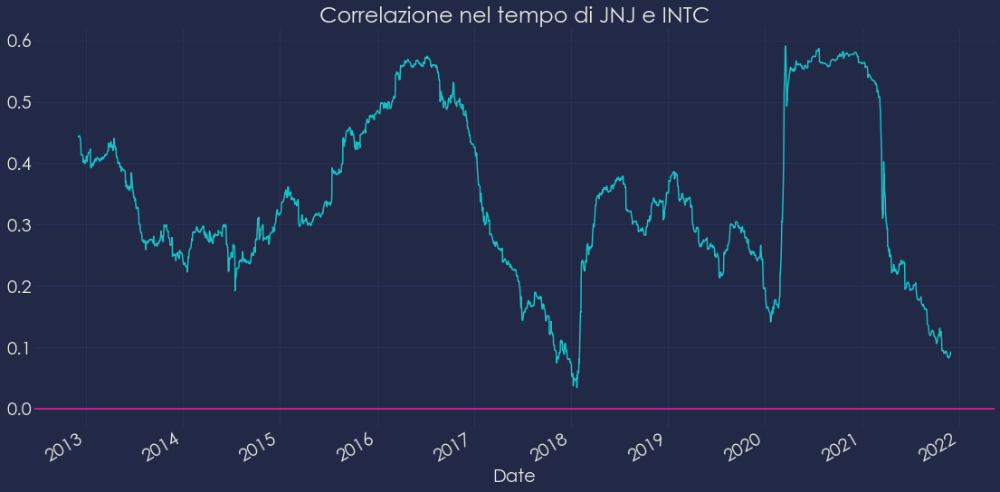

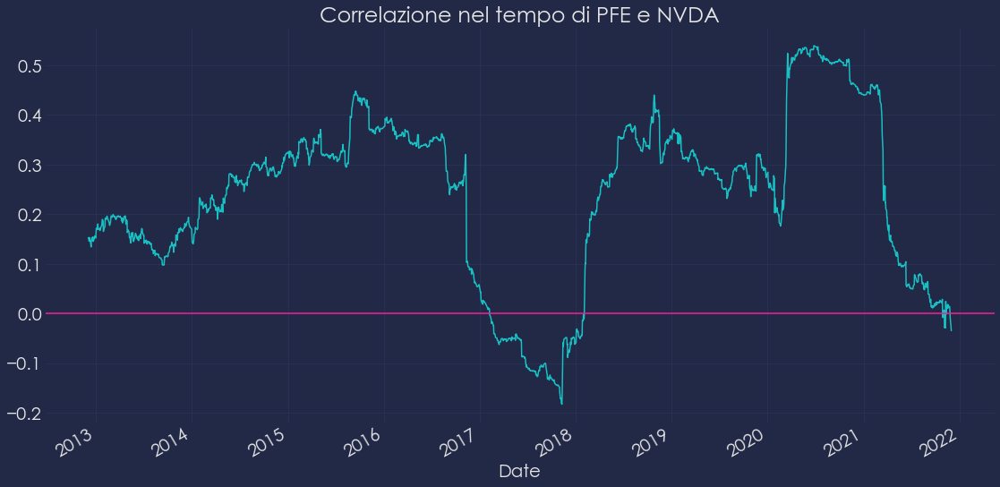

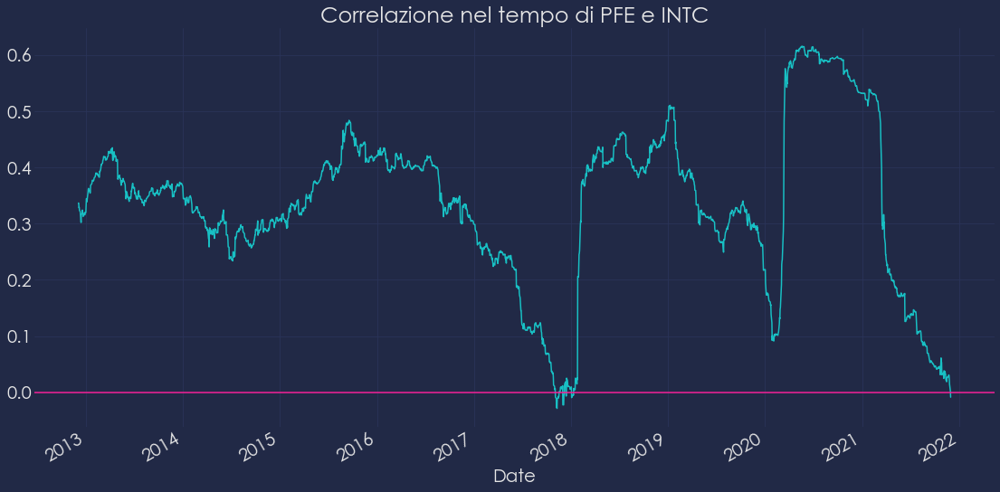

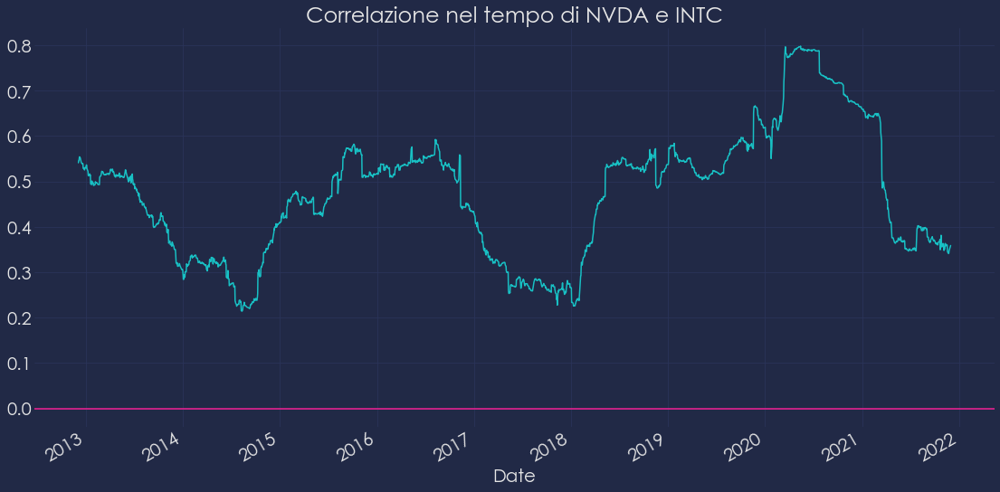

In [42]:
tickers1 = deepcopy(tickers)
tickers2 = deepcopy(tickers)
plt.rc('font', size=20)
for t1 in tickers1:
    for t2 in tickers2:
        if (t1 == t2):
            continue
        plt.figure()
        plt.title("Correlazione nel tempo di " + t1 + " e " + t2)
        ax = rets[t1].rolling(window=252).corr(rets[t2]).plot(figsize=(19,9))
        ax.axhline(0, c=colors[2])
    tickers2.remove(t1)

## Analisi di Previsione

#### Modello di previsione: SVM
#### Training set: 80 mesi
#### Validation set: 30 mesi
#### Test set: 10 mesi

In [43]:
start_date = '2011-11-30'
end_date = '2021-11-30'

In [44]:
# Creo una funzione per la ricerca degli iperparametri migliori
def arima_grid_search(dataframe, s):
    
    p = d = q = range(2)
    param_combinations = list(itertools.product(p, d, q))
    lowest_aic, pdq, pdqs = None, None, None
    total_iterations = 0
    for order in param_combinations:
        for (p, q, d) in param_combinations:
            seasonal_order = (p, q, d, s)
            total_iterations += 1
            try:
                model = SARIMAX(dataframe, order = order,
                               seasonal_order= seasonal_order,
                               enforce_stationarity=False,
                               enforce_invertibility=False,
                               disp = False
                               )
                model_result = model.fit(maxiter=200, disp=False)
                
                if not lowest_aic or model_result.aic < lowest_aic:
                    lowest_aic = model_result.aic
                    pdq, pdqs = order, seasonal_order
            
            except Exception as ex:
                print(ex)
                continue
    return lowest_aic, pdq, pdqs

In [45]:
def SARIMAX_model(df_settle, ticker):
    
    real = deepcopy(df_settle)
    
    # Tolgo gli ultimi 10 mesi da predirre dal dataset
    df_settle.drop(df_settle.tail(10).index, inplace=True)
    
    # Ultimo mese prima della previsione
    last_row = df_settle.tail(1)
    
    # Cerco gli iperparametri migliori
    lowest_aic, order, seasonal_order = arima_grid_search(df_settle, 12)
    
    print('ARIMA {}x{}'.format(order, seasonal_order))
    print('Lowest AIC: %.3f'%lowest_aic)
    
    model = SARIMAX(df_settle, order = order,
                               seasonal_order= seasonal_order,
                               enforce_stationarity=False,
                               enforce_invertibility=False,
                               disp = False
                               )
    
    model_results = model.fit(maxiter=200, disp=False)
    
    print(model_results.summary())
    
    # Grafici diagnostici del modello
    model_results.plot_diagnostics(figsize=(12,8));
    model_results.resid.describe()
    
    # Eseguo la previsione sul set di validazione
    n = len(df_settle.index)
    validation = model_results.get_prediction(start=n-30, end=n)
    
    # Ottengo l'intervallo di confidenza della previsione
    validation_ci = validation.conf_int()
    
    print(validation_ci.head())
    
    plt.figure(figsize=(12,6))
    plt.rc('font', size=9)
    
    # Grafico dei prezzi reali
    ax = real['2010':].plot(label = 'Actual Price')
    
    # Grafico dell'intervallo di confidenza sul set di validazione
    validation_ci.plot(ax=ax, style = ['--', '--'])
    ci_index_val = validation_ci.index
    lower_ci_val = validation_ci.iloc[:,0]
    upper_ci_val = validation_ci.iloc[:,1]
    
    # Predico 10 mesi in avanti
    prediction = model_results.get_forecast(steps=10)
    
    # Ottengo la media e l'intervallo di confidenza della previsione
    prediction_mean = prediction.predicted_mean
    prediction_ci = prediction.conf_int()
    
    # Concateno il set di training con la previsione
    result = pd.concat([df_settle, prediction_mean])
    
    # Inserisco all'inizio della previsione il valore dell'ultimo mese del dataset di training
    prediction_mean = pd.concat([last_row, prediction_mean])  
    
    # Grafico dell'intervallo di confidenza sulla previsione nel futuro
    prediction_ci.plot(ax=ax, style = ['--', '--'])
    ci_index = prediction_ci.index
    lower_ci = prediction_ci.iloc[:,0]
    upper_ci = prediction_ci.iloc[:,1]
    
    # Grafico della previsione
    prediction_mean.plot(color = 'y', label='Prediction')
    
    ax.fill_between(ci_index_val, lower_ci_val, upper_ci_val, color = 'b', alpha = 0.1)
    ax.fill_between(ci_index, lower_ci, upper_ci, color = 'b', alpha = 0.1)
    
    ax.set_xlabel('Time (years)')
    ax.set_ylabel('Price')
    
    plt.legend();
    plt.title(ticker)
    plt.grid()
    plt.show()
    
    return result

In [46]:
predictions = pd.DataFrame()

ARIMA (0, 1, 1)x(0, 1, 1, 12)
Lowest AIC: 398.364
                                     SARIMAX Results                                      
Dep. Variable:                                 GM   No. Observations:                  111
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -196.182
Date:                            Mon, 13 Jun 2022   AIC                            398.364
Time:                                    09:48:40   BIC                            405.656
Sample:                                11-30-2011   HQIC                           401.295
                                     - 01-31-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.1405      0.136      1.030      0.303      -0.1

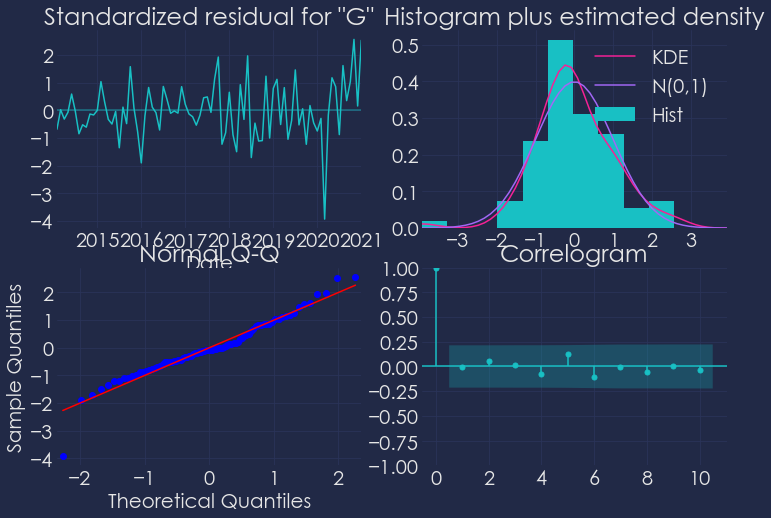

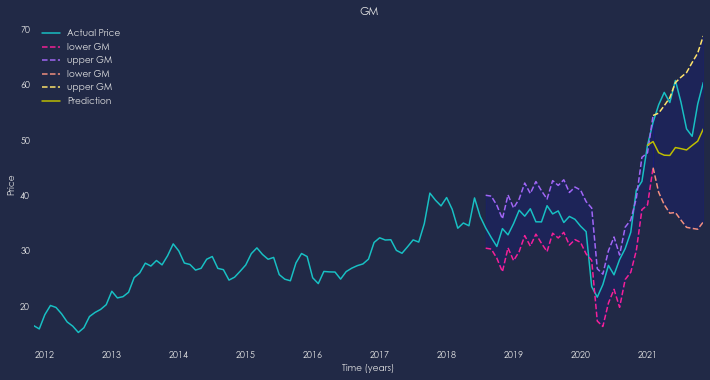

In [47]:
data = deepcopy(month_data['GM'])
predictions['GM'] = SARIMAX_model(data, 'GM')

ARIMA (1, 0, 1)x(0, 1, 1, 12)
Lowest AIC: 752.770
                                     SARIMAX Results                                      
Dep. Variable:                               TSLA   No. Observations:                  111
Model:             SARIMAX(1, 0, 1)x(0, 1, 1, 12)   Log Likelihood                -372.385
Date:                            Mon, 13 Jun 2022   AIC                            752.770
Time:                                    09:48:55   BIC                            762.540
Sample:                                11-30-2011   HQIC                           756.700
                                     - 01-31-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.2295      0.011    115.499      0.000       1.2

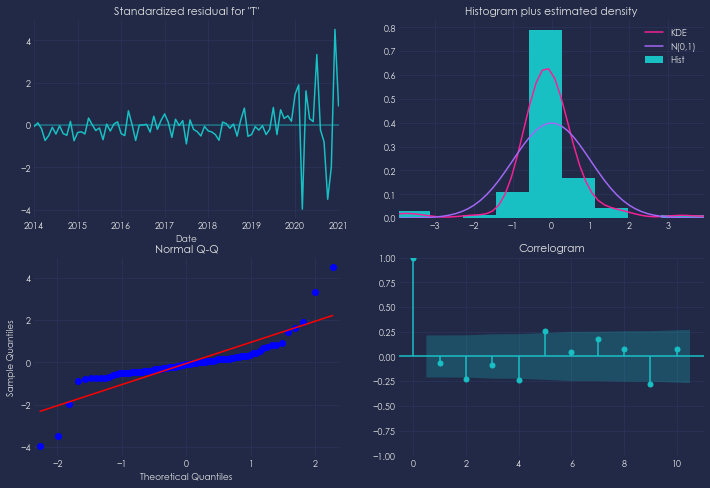

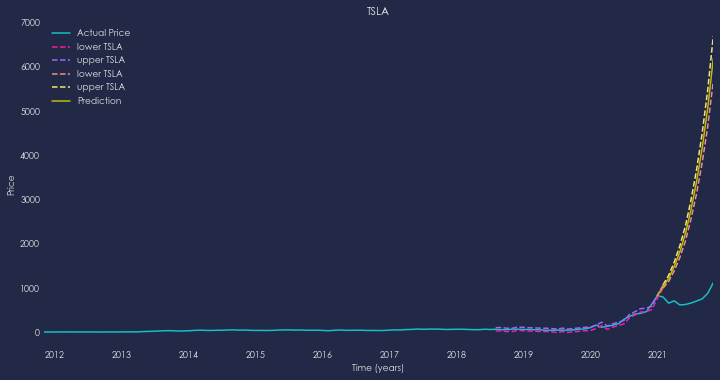

In [48]:
data = deepcopy(month_data['TSLA'])
predictions['TSLA'] = SARIMAX_model(data, 'TSLA')

ARIMA (0, 1, 1)x(0, 1, 1, 12)
Lowest AIC: 502.543
                                     SARIMAX Results                                      
Dep. Variable:                                JNJ   No. Observations:                  111
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -248.272
Date:                            Mon, 13 Jun 2022   AIC                            502.543
Time:                                    09:49:06   BIC                            509.835
Sample:                                11-30-2011   HQIC                           505.475
                                     - 01-31-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0625      0.079     -0.793      0.428      -0.2

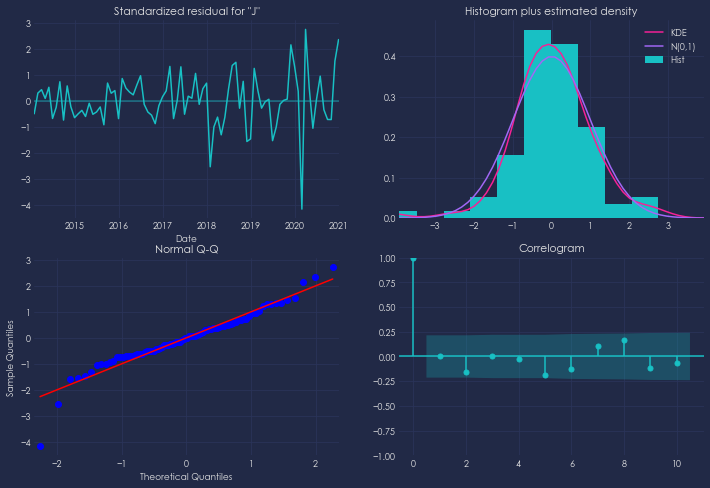

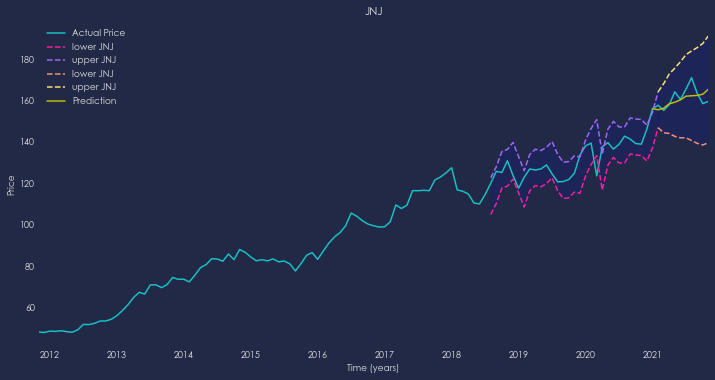

In [49]:
data = deepcopy(month_data['JNJ'])
predictions['JNJ'] = SARIMAX_model(data, 'JNJ')

ARIMA (1, 1, 1)x(1, 1, 1, 12)
Lowest AIC: 301.725
                                     SARIMAX Results                                      
Dep. Variable:                                PFE   No. Observations:                  111
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -145.863
Date:                            Mon, 13 Jun 2022   AIC                            301.725
Time:                                    09:49:16   BIC                            313.879
Sample:                                11-30-2011   HQIC                           306.611
                                     - 01-31-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5565      0.197     -2.821      0.005      -0.9

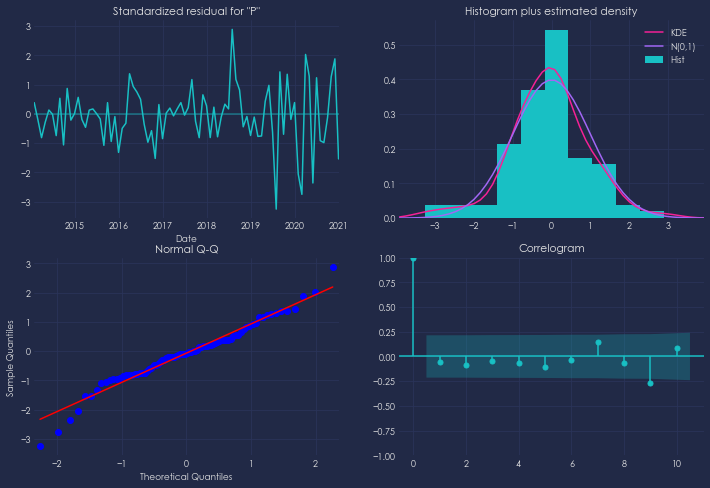

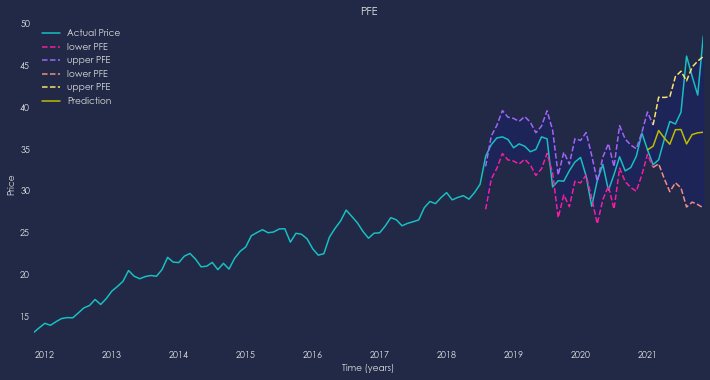

In [50]:
data = deepcopy(month_data['PFE'])
predictions['PFE'] = SARIMAX_model(data, 'PFE')

ARIMA (1, 1, 1)x(0, 1, 1, 12)
Lowest AIC: 489.061
                                     SARIMAX Results                                      
Dep. Variable:                               NVDA   No. Observations:                  111
Model:             SARIMAX(1, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -240.531
Date:                            Mon, 13 Jun 2022   AIC                            489.061
Time:                                    09:49:31   BIC                            498.784
Sample:                                11-30-2011   HQIC                           492.970
                                     - 01-31-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6151      0.140      4.388      0.000       0.3

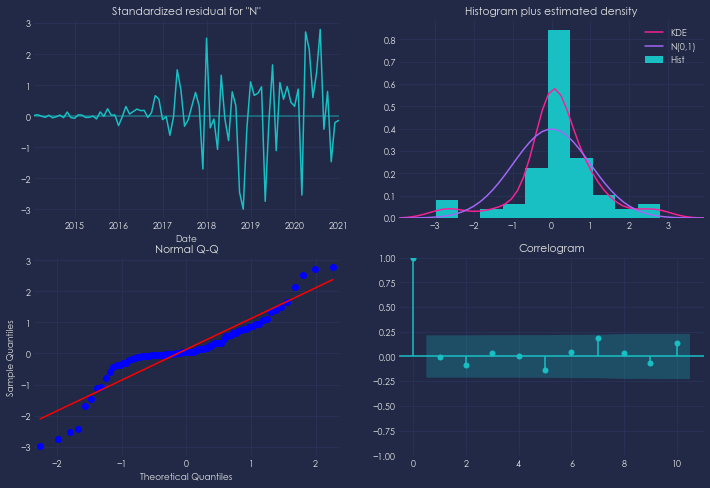

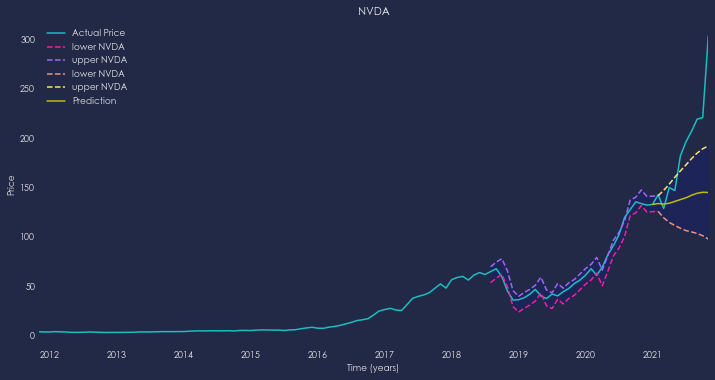

In [51]:
data = deepcopy(month_data['NVDA'])
predictions['NVDA'] = SARIMAX_model(data, 'NVDA')

ARIMA (0, 1, 1)x(1, 1, 1, 12)
Lowest AIC: 423.128
                                     SARIMAX Results                                      
Dep. Variable:                               INTC   No. Observations:                  111
Model:             SARIMAX(0, 1, 1)x(1, 1, 1, 12)   Log Likelihood                -207.564
Date:                            Mon, 13 Jun 2022   AIC                            423.128
Time:                                    09:49:47   BIC                            432.851
Sample:                                11-30-2011   HQIC                           427.037
                                     - 01-31-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.1841      0.126     -1.463      0.144      -0.4

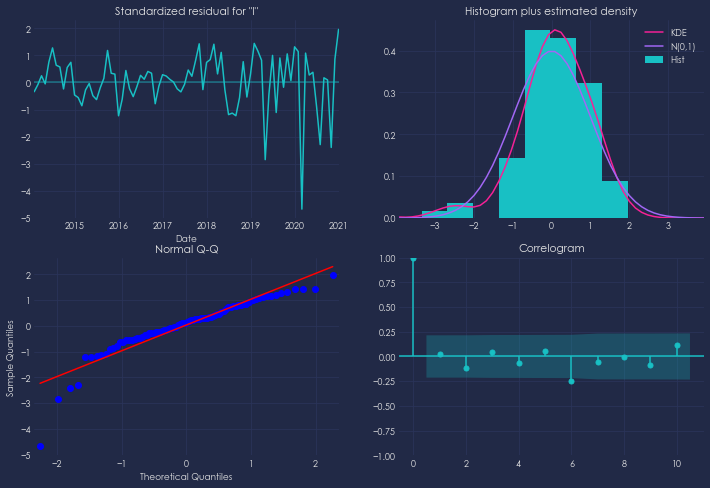

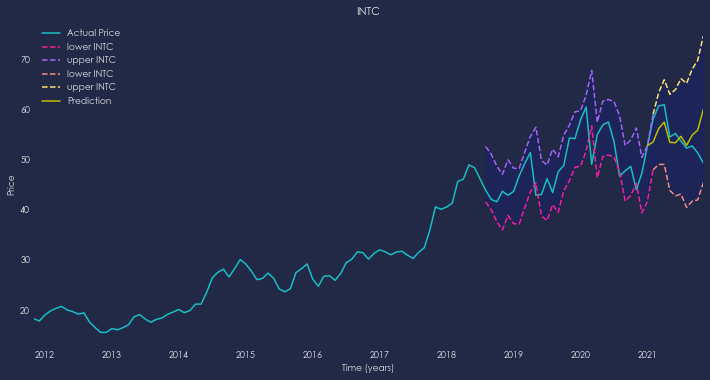

In [52]:
data = deepcopy(month_data['INTC'])
predictions['INTC'] = SARIMAX_model(data, 'INTC')

## Strategie di trading e backtesting

### SMA, EWM e Buy and Hold

In [53]:
def SMA_EWM_strategy(ticker, start_date, end_date):
    
    # Importiamo i dati
    data = web.DataReader(ticker, 'yahoo', start_date, end_date)
    data = data.drop(columns = ['High', 'Low', 'Open', 'Close'])
    
    # Creiamo le due serie di medie mobili, una a 20 giorni e una a 120 giorni
    data['SMA20'] = data['Adj Close'].rolling(20).mean()
    data['SMA120'] = data['Adj Close'].rolling(120).mean()
    
    # Creiamo la strategia
    data['Price_yesterday'] = data['Adj Close'].shift(1)
    data['Change'] = data['Adj Close'] / data['Price_yesterday']
    data['Invested_SMA'] = [1 if data.loc[i, 'SMA20'] > data.loc[i, 'SMA120'] 
                        else 0 for i in data.index]
    
    # Rendimento della strategia
    sma = data[data['Invested_SMA'] == 1]
    sma['Return'] = np.cumprod(sma['Change'])
    sma['rtn'] =sma['Return'].pct_change()
    sma['rtn'].std()*np.sqrt(252)
    sma['rtn'].mean()*252 / (sma['rtn'].std()*np.sqrt(252))
    
    # Medie mobili esponenziali
    data['EWM12'] = data['Adj Close'].ewm(span=12, adjust=False).mean()
    data['EWM26'] = data['Adj Close'].ewm(span=26, adjust=False).mean()
    data['Invested_EWM'] = [1 if data.loc[i, 'EWM12'] > data.loc[i, 'EWM26'] 
                            else 0 for i in data.index]
    ewm = data[data['Invested_EWM'] == 1]
    ewm['Return'] = np.cumprod(ewm['Change'])
    
    # Rendimento della buy and hold
    data['Buy_and_hold'] = np.cumprod(data['Change'])
    data['rtn'] = data['Buy_and_hold'].pct_change()
    data['rtn'].std()
    data['rtn'].mean()*252 / (data['rtn'].std()*np.sqrt(252))
    
    # Print results
    print('Buy and hold strategy return: ' + ticker + ' '+   str(data['Buy_and_hold'][-1]))
    print('SMA return: ' + ticker + ' ' + str(sma['Return'][-1]))
    print('EWM return: ' + ticker + ' ' + str(ewm['Return'][-1]))
    
    # Grafici
    plt.figure(figsize=(16,9))
    plt.rc('font', size=15, family='Century Gothic')
    
    ax1 = plt.subplot2grid((10,1), (0,0), rowspan = 4, colspan = 1, title = ticker)
    ax2 = plt.subplot2grid((10,1), (5,0), rowspan = 2, colspan = 1, sharex = ax1)
    ax3 = plt.subplot2grid((10,1), (8,0), rowspan = 2, colspan = 1, sharex = ax1)
    ax1.plot(data['Adj Close'], label = 'Price')
    ax1.plot(data['SMA20'], label = 'SMA20')
    ax1.plot(data['SMA120'], label = 'SMA120')
    ax1.plot(data['EWM12'], label = 'EWM12')
    ax1.plot(data['EWM26'], label = 'EWM26')

    ax2.bar(data.index, data['Volume'], label = 'Volume')
    ax3.plot(data['Buy_and_hold'], label = 'Buy and hold')
    ax3.plot(sma['Return'], label = 'SMA')
    ax3.plot(ewm['Return'], label ='EWM')
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax3.set_xlabel('Date (Year - month)')
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    print('\n')

Buy and hold strategy return: GM 3.5168836937417396
SMA return: GM 1.7527127684761044
EWM return: GM 8.255967734158467


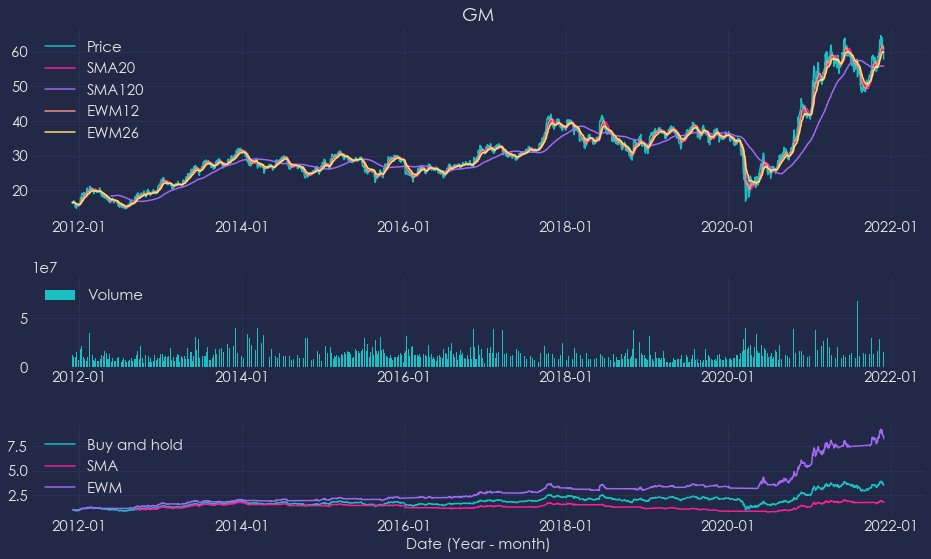



Buy and hold strategy return: TSLA 174.82590629829136
SMA return: TSLA 59.60161256789696
EWM return: TSLA 327.7784518064859


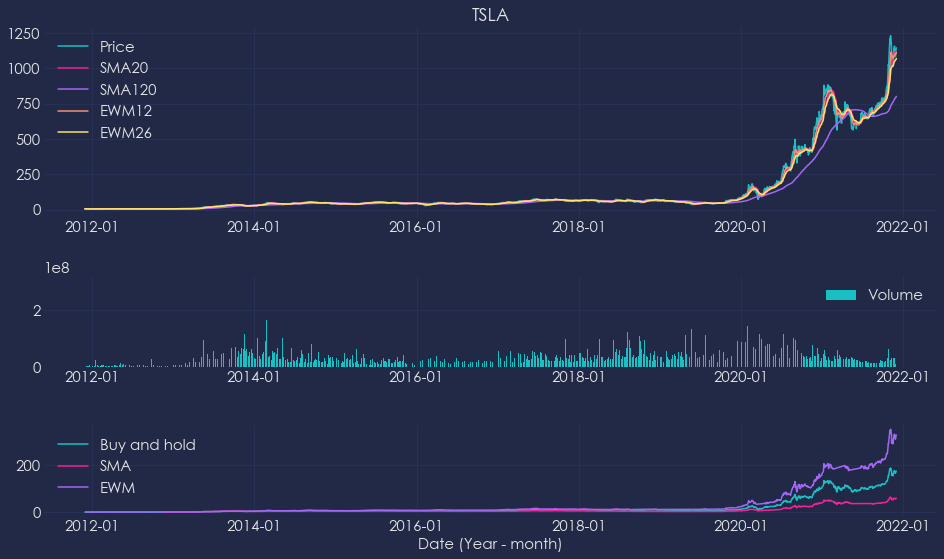



Buy and hold strategy return: JNJ 3.196122589725836
SMA return: JNJ 1.783210480381956
EWM return: JNJ 2.9688667297267637


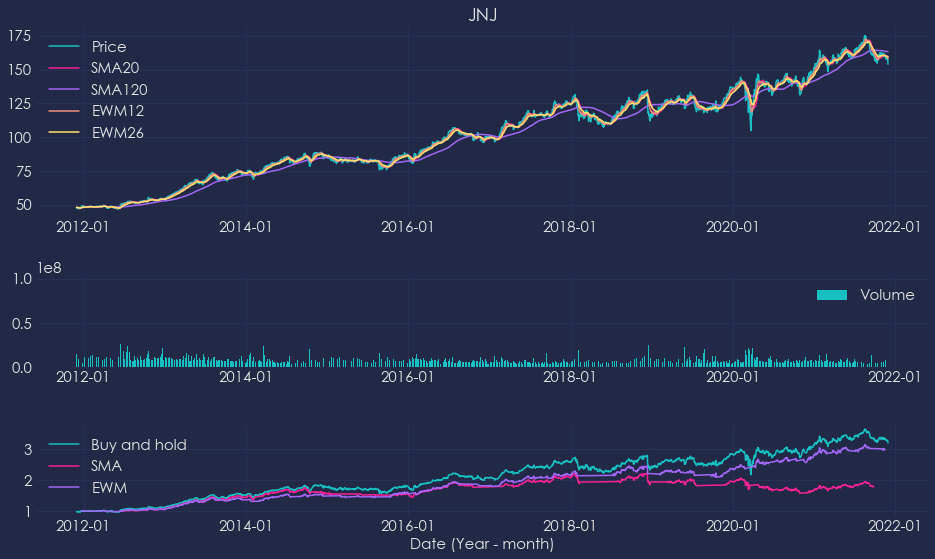



Buy and hold strategy return: PFE 4.061784309304119
SMA return: PFE 1.6680239791475557
EWM return: PFE 4.559829322624859


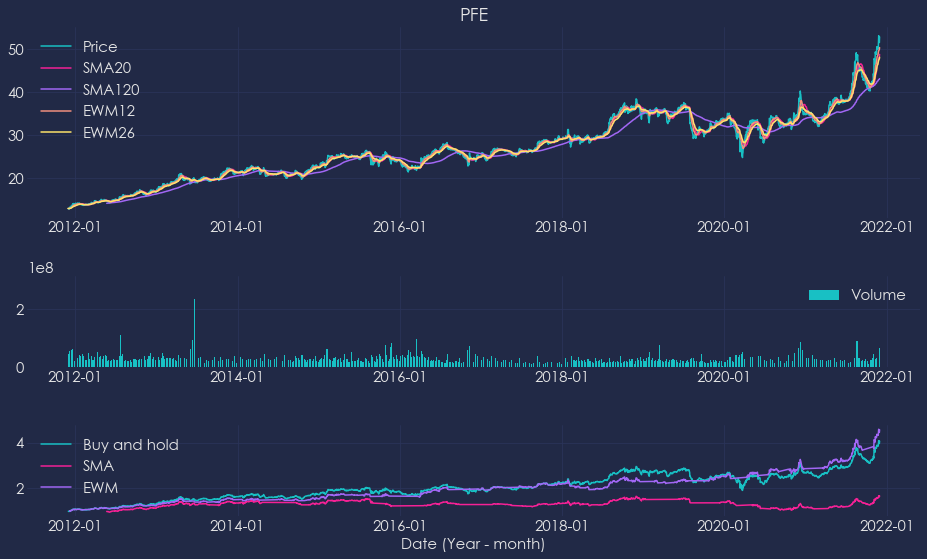



Buy and hold strategy return: NVDA 91.02179715024653
SMA return: NVDA 49.955548530540945
EWM return: NVDA 92.56747312236915


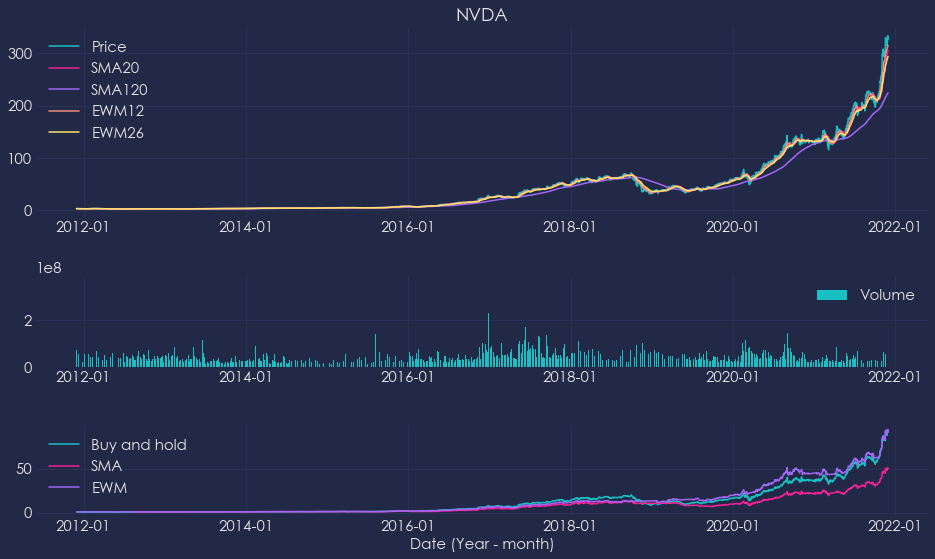



Buy and hold strategy return: INTC 2.6505947802268093
SMA return: INTC 1.5050300410216269
EWM return: INTC 4.66584590621828


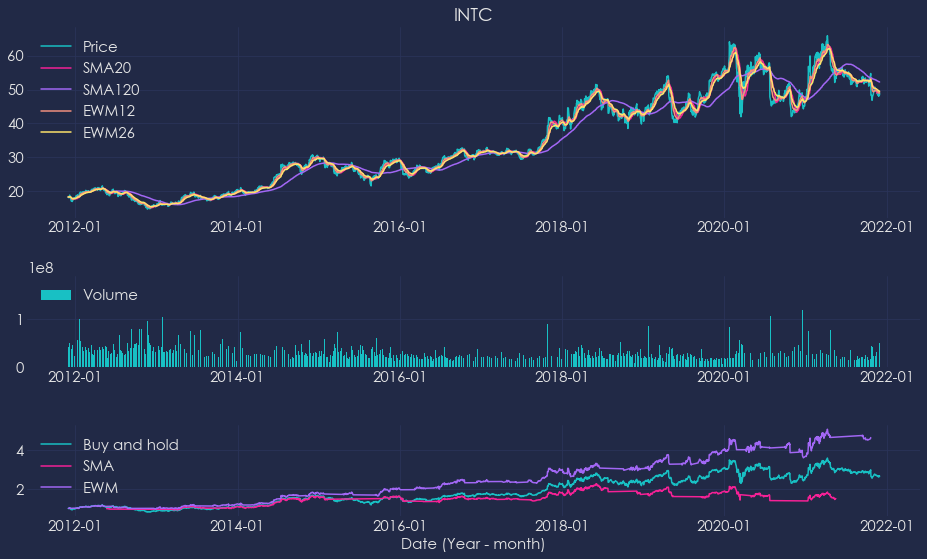

In [54]:
for ticker in tickers:
    SMA_EWM_strategy(ticker, start_date, end_date)

## CAPM

In [55]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

#plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

### Calcolo del Beta, Esposizione ai fattori di rischio Fama-French e Rendimento Atteso

In [56]:
start_date = '2011-11-30'
end_date = '2021-11-30'

factor_df = web.DataReader('F-F_Research_Data_Factors', 'famafrench', start = start_date)[0]
factor_df = factor_df.apply(pd.to_numeric, errors='coerce').div(100)
factor_df.index = factor_df.index.format()

Risk free

In [57]:
rf = '^IRX'
risk_free_df = web.get_data_yahoo(rf, start_date, end_date)
risk_free_df = risk_free_df.resample('M').last()
risk_free_df["mrf"] = (1 + risk_free_df['Adj Close'])**(30/360) - 1
risk_free = risk_free_df["mrf"]

Calcolo del beta

In [58]:
def get_beta(risky_asset, start_date, end_date):
    market_benchmark = '^GSPC' # S&P 500
    df = web.get_data_yahoo([risky_asset, market_benchmark], start = start_date, end = end_date)
    X = df['Adj Close'].rename(columns={risky_asset:'asset', market_benchmark:'market'})\
        .resample('M').last().pct_change().dropna()
    covariance = X.cov().iloc[0,1]
    benchmark_variance = X.market.var()
    beta = covariance / benchmark_variance
    return beta, X.market

Esposizione ai fattori di rischio Fama-French

In [59]:
def get_ff_model(risky_asset, factor_df, start_date, end_date):
    asset_df = web.get_data_yahoo(risky_asset, start_date, end_date) 
    y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()
    y.index = y.index.strftime('%Y-%m')
    ff_data = factor_df.join(y)
    ff_data.columns = ['mkt', 'smb', 'hml', 'rf', risky_asset]
    ff_data['excess_rtn'] = ff_data[risky_asset] - ff_data['rf']
    ff_model = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_data).fit()
    return ff_model, ff_data

Calcolo rendimento atteso

In [60]:
def get_exp_rtn(ff_data, beta, market):
    rf_asset = risk_free.iloc[-12].mean()
    #market_premium = ff_data['mkt'].iloc[-12].mean()
    market_premium = market.iloc[-12].mean()
    exp_rtn = rf_asset + beta * (market_premium - rf_asset)
    return exp_rtn

In [61]:
betas = {}

In [62]:
for t in tickers:
#test = ['X']
#for t in test:  
    
    print(t)
    
    # Calcolo del beta
    beta, market = get_beta(t, start_date, end_date)
    betas[t] = beta
    print('\nBeta di ' + t + ': ', beta)
    print('\n')
    
    # Esposizione ai fattori di rischio Fama-French
    ff_model, ff_data = get_ff_model(t, factor_df, start_date, end_date)
    print(ff_model.summary())
    
    # Calcolo rendimento atteso
    exp_rtn = get_exp_rtn(ff_data, beta, market)
    print('\nRendimento atteso di ' + t + ': ', exp_rtn)
    
    print('\n\n******************************************************************************\n\n')

GM

Beta di GM:  1.240835074054097


                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.483
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     36.19
Date:                Mon, 13 Jun 2022   Prob (F-statistic):           1.39e-16
Time:                        09:50:53   Log-Likelihood:                 165.93
No. Observations:                 120   AIC:                            -323.9
Df Residuals:                     116   BIC:                            -312.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      


Beta di NVDA:  1.3453846526816715


                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                  0.239
Method:                 Least Squares   F-statistic:                     13.44
Date:                Mon, 13 Jun 2022   Prob (F-statistic):           1.37e-07
Time:                        09:51:03   Log-Likelihood:                 113.68
No. Observations:                 120   AIC:                            -219.4
Df Residuals:                     116   BIC:                            -208.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      

## Costruzione di Portafoglio

In [63]:
plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle')
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
plt.rc('font', size=10, family='Century Gothic')
warnings.simplefilter(action='ignore', category=FutureWarning)

# Possibilità di abilitare o meno la modalità scura
primary_color = 'black'
if(dark_mode):
    plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle')
    primary_color = 'white'
else:
    plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-light.mplstyle')

### Frontiera efficiente con metodo Monte Carlo

In [64]:
n_port = 10 ** 5
n_months = 12
risky_assets =  ['GM', 'TSLA', 'JNJ', 'PFE', 'NVDA', 'INTC']
n_assets = len(risky_assets)
prices_df = month_data

In [65]:
def get_portfolio(adj_close, n_port, n_assets, n_months):

    returns_df = adj_close.pct_change().dropna()
    avg_returns = returns_df.mean() * n_months
    cov_mat = returns_df.cov() * n_months
    
    np.random.seed(42)
    weights = np.random.random(size=(n_port, n_assets))
    weights /=  np.sum(weights, axis=1)[:, np.newaxis]

    portf_rtns = np.dot(weights, avg_returns)
    portf_vol = []
    for i in range(0, len(weights)):
        portf_vol.append(np.sqrt(np.dot(weights[i].T, 
                                        np.dot(cov_mat, weights[i]))))
    portf_vol = np.array(portf_vol)  
    portf_sharpe_ratio = portf_rtns / portf_vol
    portf_results_df = pd.DataFrame({'returns': portf_rtns,
                                     'volatility': portf_vol,
                                     'sharpe_ratio': portf_sharpe_ratio})
    n_points = 100
    portf_vol_ef = []
    indices_to_skip = []

    portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                                portf_results_df.returns.max(), 
                               n_points)
    portf_rtns_ef = np.round(portf_rtns_ef, 2)    
    portf_rtns = np.round(portf_rtns, 2)

    for point_index in range(n_points):
        if portf_rtns_ef[point_index] not in portf_rtns:
            indices_to_skip.append(point_index)
            continue
        matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
        portf_vol_ef.append(np.min(portf_vol[matched_ind]))

    portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)
    MARKS = ['o', 'X', 'd', '*', 'h', 'p']

    fig, ax = plt.subplots()
    portf_results_df.plot(kind='scatter', x='volatility', 
                          y='returns', c='sharpe_ratio',
                          cmap='GnBu', edgecolors='black', 
                          ax=ax, linewidth=0.3)
    ax.set(xlabel='Volatility', 
           ylabel='Expected Returns', 
           title='Efficient Frontier')
    #ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
    for asset_index in range(n_assets):
        ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                    y=avg_returns[asset_index], 
                    marker=MARKS[asset_index], 
                    s=150, 
                    color=primary_color,
                    label=risky_assets[asset_index])
    ax.legend()

    plt.tight_layout()
    plt.show()
    
    return portf_results_df, avg_returns, cov_mat, weights

In [66]:
def best_portf(portf_results_df, weights):
    
    max_sharpe_ind = np.argmax(portf_results_df.sharpe_ratio)
    max_sharpe_portf = portf_results_df.loc[max_sharpe_ind]

    min_vol_ind = np.argmin(portf_results_df.volatility)
    min_vol_portf = portf_results_df.loc[min_vol_ind]
    
    # Maximum Sharpe Ratio portfolio
    print('Maximum Sharpe Ratio portfolio')
    print('Performance')
    for index, value in max_sharpe_portf.items():
        print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
    print('\nWeights')
    for x, y in zip(risky_assets, weights[np.argmax(portf_results_df.sharpe_ratio)]):
        print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    
    print('\n')
    
    # Minimum Volatility portfolio
    print('Minimum Volatility portfolio ----')
    print('Performance')
    for index, value in min_vol_portf.items():
        print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
    print('\nWeights')
    for x, y in zip(risky_assets, weights[np.argmin(portf_results_df.volatility)]):
        print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    
    # Plot best portfolios
    fig, ax = plt.subplots()
    portf_results_df.plot(kind='scatter', x='volatility', 
                          y='returns', c='sharpe_ratio',
                          cmap='GnBu', edgecolors='black', 
                          ax=ax, linewidth=0.3)
    ax.scatter(x=max_sharpe_portf.volatility, 
               y=max_sharpe_portf.returns, 
               c=primary_color, marker='*', 
               s=200, label='Max Sharpe Ratio')
    ax.scatter(x=min_vol_portf.volatility, 
               y=min_vol_portf.returns, 
               c=primary_color, marker='P', 
               s=200, label='Minimum Volatility')
    ax.set(xlabel='Volatility', ylabel='Expected Returns', 
           title='Efficient Frontier')
    ax.legend()

    plt.tight_layout()

    plt.show()
    
    return min_vol_portf, max_sharpe_portf

### Frontiera efficiente con funzione di ottimizazzione Scipy

In [67]:
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))

def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    
    efficient_portfolios = []
    
    n_assets = len(avg_returns)
    args = (avg_returns, cov_mat)
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = ({'type': 'eq', 
                        'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
                       {'type': 'eq', 
                        'fun': lambda x: np.sum(x) - 1})
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                           args=args, method='SLSQP', 
                                           constraints=constraints,
                                           bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
    
    return efficient_portfolios

def neg_sharpe_ratio(w, avg_rtns, cov_mat, rf_rate):
    portf_returns = np.sum(avg_rtns * w)
    portf_volatility = np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
    portf_sharpe_ratio = (portf_returns - rf_rate) / portf_volatility
    return -portf_sharpe_ratio

In [68]:
def best_scify_portf(portf_results_df, avg_returns, cov_mat):
    
    rtns_range = np.linspace(-0.22, 0.32, 200)
    efficient_portfolios = get_efficient_frontier(avg_returns, 
                                                  cov_mat, 
                                                  rtns_range)
    vols_range = [x['fun'] for x in efficient_portfolios]
    
    # Minimum Volatility portfolio
        
    min_vol_ind = np.argmin(vols_range)
    min_vol_portf_rtn = rtns_range[min_vol_ind]
    min_vol_portf_vol = efficient_portfolios[min_vol_ind]['fun']

    min_vol_portf = {'Return': min_vol_portf_rtn,
                     'Volatility': min_vol_portf_vol,
                     'Sharpe Ratio': (min_vol_portf_rtn / 
                                      min_vol_portf_vol)}
    
    print('Minimum Volatility portfolio ----')
    print('Performance')

    for index, value in min_vol_portf.items():
        print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

    print('\nWeights')
    for x, y in zip(risky_assets, efficient_portfolios[min_vol_ind]['x']):
        print(f'{x}: {100*y:.2f}% ', end="", flush=True)
        
    n_assets = len(avg_returns)
    RF_RATE = 0

    args = (avg_returns, cov_mat, RF_RATE)
    constraints = ({'type': 'eq', 
                    'fun': lambda x: np.sum(x) - 1})
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets]
    
    # Maximum Sharpe Ratio portfolio

    max_sharpe_portf = sco.minimize(neg_sharpe_ratio, 
                                    x0=initial_guess, 
                                    args=args,
                                    method='SLSQP', 
                                    bounds=bounds, 
                                    constraints=constraints)
    
    max_sharpe_portf_w = max_sharpe_portf['x']
    max_sharpe_portf = {'Return': get_portf_rtn(max_sharpe_portf_w, 
                                                avg_returns),
                        'Volatility': get_portf_vol(max_sharpe_portf_w, 
                                                    avg_returns, 
                                                    cov_mat),
                        'Sharpe Ratio': -max_sharpe_portf['fun']}
    
    print('\n')
    print(max_sharpe_portf)
    print('\n')
    
    print('Maximum Sharpe Ratio portfolio ----')
    print('Performance')

    for index, value in max_sharpe_portf.items():
        print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

    print('\nWeights')
    for x, y in zip(risky_assets, max_sharpe_portf_w):
        print(f'{x}: {100*y:.2f}% ', end="", flush=True)
        
    # Grafico
    
    fig, ax = plt.subplots()

    portf_results_df.plot(kind='scatter', x='volatility', 
                          y='returns', c='sharpe_ratio',
                          cmap='GnBu', edgecolors='black', 
                          ax=ax, linewidth=0.3)
    
    ax.scatter(x=max_sharpe_portf['Volatility'], 
               y=max_sharpe_portf['Return'], 
               c=primary_color, marker='*', 
               s=200, label='Max Sharpe Ratio')
    ax.scatter(x=min_vol_portf['Volatility'], 
               y=min_vol_portf['Return'], 
               c=primary_color, marker='P', 
               s=200, label='Minimum Volatility')

    ax.set(xlabel='Volatility', 
           ylabel='Expected Returns', 
           title='Efficient Frontier')

    plt.legend()
    plt.show()
    
    return min_vol_portf, max_sharpe_portf

### Metodo Monte Carlo

120 mesi effettivi

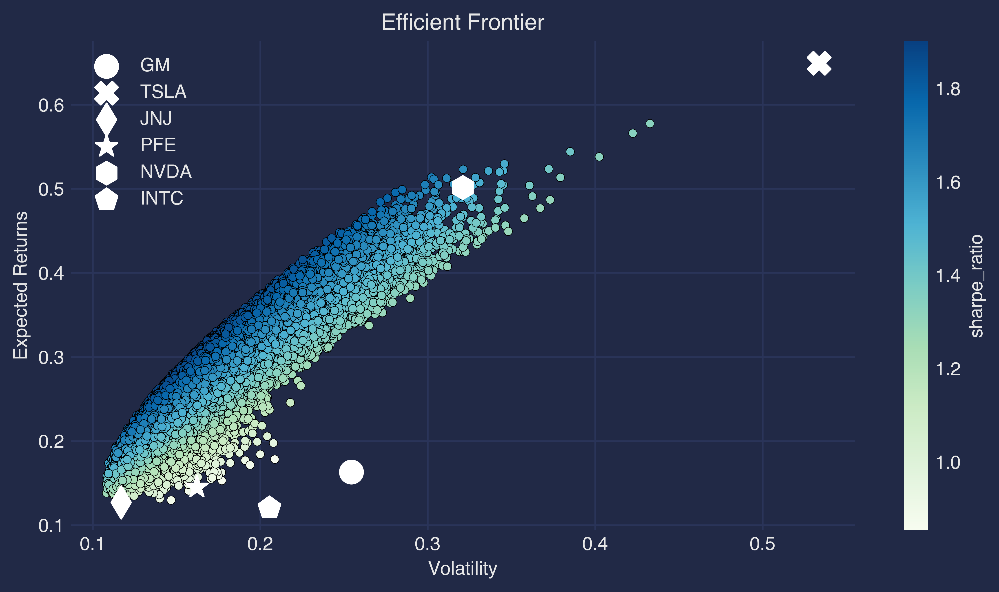

In [69]:
portf_results_df, avg_returns, cov_mat, weights = get_portfolio(prices_df, n_port, n_assets, n_months)

110 mesi effettivi + 10 mesi attesi

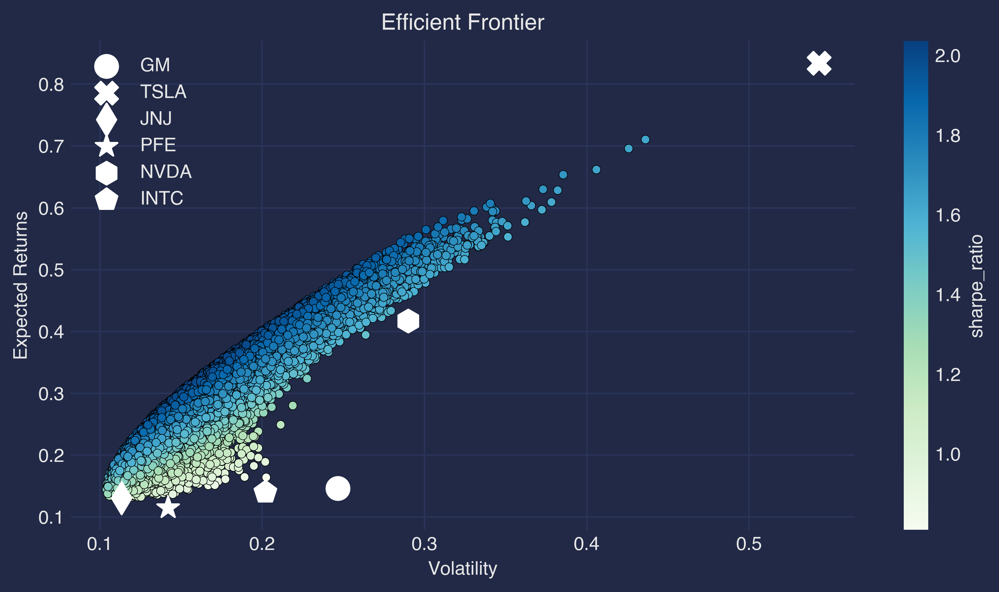

In [70]:
portf_results_df_pred, avg_returns_pred, cov_mat_pred, weights_pred = get_portfolio(predictions, n_port, n_assets, n_months)

120 mesi effettivi

Maximum Sharpe Ratio portfolio
Performance
returns: 32.05% volatility: 16.85% sharpe_ratio: 190.18% 
Weights
GM: 1.53% TSLA: 12.93% JNJ: 36.22% PFE: 15.26% NVDA: 32.75% INTC: 1.31% 

Minimum Volatility portfolio ----
Performance
returns: 13.82% volatility: 10.82% sharpe_ratio: 127.74% 
Weights
GM: 6.41% TSLA: 0.43% JNJ: 38.93% PFE: 30.21% NVDA: 0.69% INTC: 23.34% 

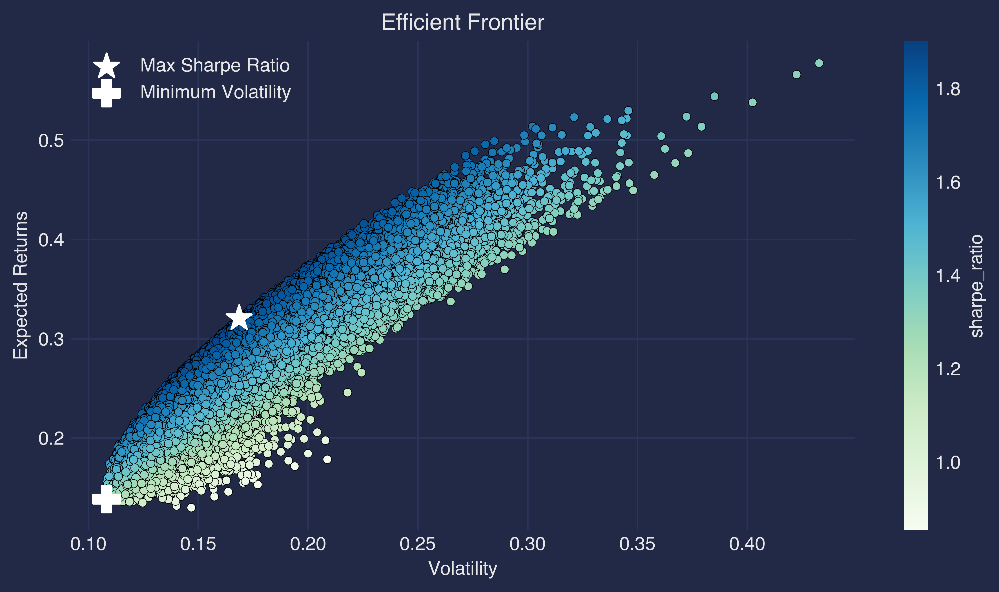

In [71]:
min_vol_portf, max_sharpe_portf = best_portf(portf_results_df, weights)

110 mesi effettivi + 10 mesi attesi

Maximum Sharpe Ratio portfolio
Performance
returns: 33.38% volatility: 16.40% sharpe_ratio: 203.61% 
Weights
GM: 0.28% TSLA: 17.09% JNJ: 35.78% PFE: 16.81% NVDA: 29.94% INTC: 0.10% 

Minimum Volatility portfolio ----
Performance
returns: 14.47% volatility: 10.42% sharpe_ratio: 138.93% 
Weights
GM: 6.83% TSLA: 1.05% JNJ: 41.72% PFE: 34.31% NVDA: 3.47% INTC: 12.62% 

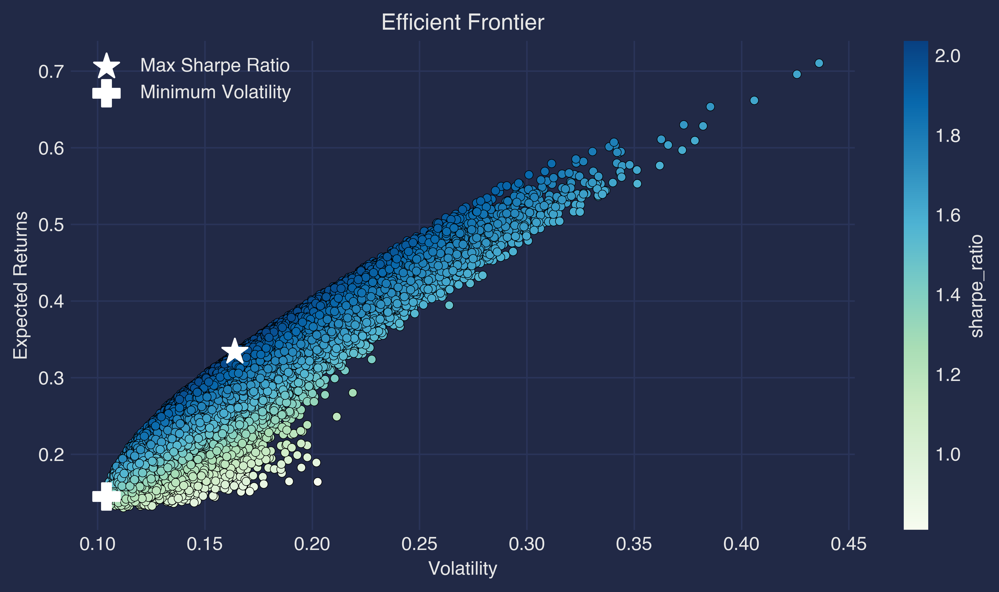

In [72]:
min_vol_portf_pred, max_sharpe_portf_pred = best_portf(portf_results_df_pred, weights_pred)

### Metodo ottimizzazione Scipy

120 mesi effettivi

Minimum Volatility portfolio ----
Performance
Return: 13.55% Volatility: 10.54% Sharpe Ratio: 128.58% 
Weights
GM: 7.59% TSLA: 0.00% JNJ: 58.42% PFE: 19.27% NVDA: 0.80% INTC: 13.92% 

{'Return': 0.3071644935838082, 'Volatility': 0.1611379504508566, 'Sharpe Ratio': 1.9062206806303297}


Maximum Sharpe Ratio portfolio ----
Performance
Return: 30.72% Volatility: 16.11% Sharpe Ratio: 190.62% 
Weights
GM: 0.55% TSLA: 11.36% JNJ: 40.25% PFE: 16.45% NVDA: 31.39% INTC: 0.00% 

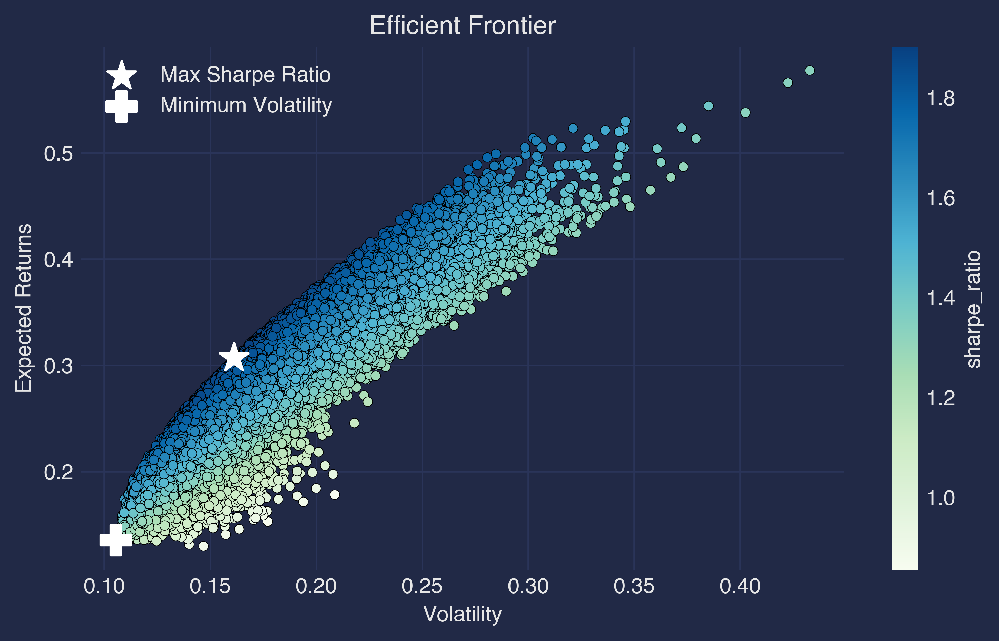

In [73]:
min_vol_portf_opt, max_sharpe_portf_opt = best_scify_portf(portf_results_df, avg_returns, cov_mat)

110 mesi effettivi + 10 mesi attesi

Minimum Volatility portfolio ----
Performance
Return: 13.55% Volatility: 10.26% Sharpe Ratio: 132.01% 
Weights
GM: 5.65% TSLA: 0.00% JNJ: 56.02% PFE: 24.94% NVDA: 2.44% INTC: 10.95% 

{'Return': 0.33067324404719245, 'Volatility': 0.1621896046689907, 'Sharpe Ratio': 2.0388066468381645}


Maximum Sharpe Ratio portfolio ----
Performance
Return: 33.07% Volatility: 16.22% Sharpe Ratio: 203.88% 
Weights
GM: 0.00% TSLA: 17.39% JNJ: 32.66% PFE: 21.59% NVDA: 28.36% INTC: 0.00% 

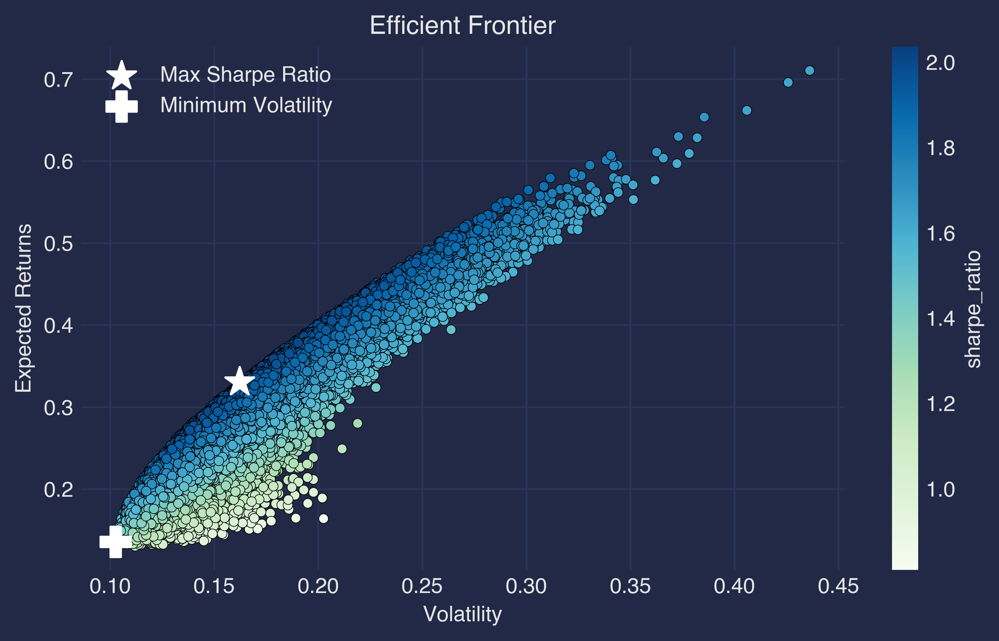

In [74]:
min_vol_portf_opt_pred, max_sharpe_portf_opt_pred = best_scify_portf(portf_results_df_pred, avg_returns_pred, cov_mat_pred)

### Calcolo del beta

In [75]:
portfolio_beta = np.array(list(betas.values())).mean()
print("Beta del portafoglio: " + str(portfolio_beta))

Beta del portafoglio: 1.0942703196131671


### Confronto con portafoglio effettivo

In [76]:
def get_actual_portfolio(adj_close, n_port, n_assets, n_months):

    returns_df = adj_close.pct_change().dropna()
    avg_returns = returns_df.mean() * n_months
    cov_mat = returns_df.cov() * n_months
    weights = np.full(n_assets, 1/n_assets)

    portf_rtns = np.dot(weights, avg_returns)
    
    portf_vol = np.sqrt(np.dot(weights.T, np.dot(cov_mat, weights)))
    
    portf_sharpe_ratio = portf_rtns / portf_vol
    
    portf_results_df = {'return': portf_rtns,
                        'volatility': portf_vol,
                        'sharpe_ratio': portf_sharpe_ratio}
    return portf_results_df

In [77]:
actual_portf_results = get_actual_portfolio(predictions, n_port, n_assets, n_months)

Rendimento portafoglio effettivo

In [78]:
actual_portf_results

{'return': 0.2970429753254494,
 'volatility': 0.16047553353324456,
 'sharpe_ratio': 1.8510172160537677}

In [79]:
actual_portf_results['return']

0.2970429753254494

Rendimento portafoglio ottimale

In [80]:
max_sharpe_portf['returns']

0.3205137378210546

In [81]:
max_sharpe_portf_pred['returns']

0.33382303434655486

In [82]:
max_sharpe_portf_opt['Return']

0.3071644935838082

In [83]:
max_sharpe_portf_opt_pred['Return']

0.33067324404719245